This new wavelength calibration method improves on Tim Brandt polynomial fitting method, by adding a step where centroids of each PSFlet is determined more accurately. An error in X and Y is then recorded, and added back systematically when trying to determine the location of a PSFlet. 

# General setup

In [1]:
%pylab inline --no-import-all
plt.rc('font', family='serif', serif='Times', size=15)
plt.rc('text', usetex=True)
plt.rc('xtick', labelsize=20)
plt.rc('xtick.major', size=10)
plt.rc('ytick.major', size=10)
plt.rc('ytick', labelsize=20)
plt.rc('axes', labelsize=20)
plt.rc('figure', titlesize=25)
plt.rcParams['image.origin'] = 'lower'
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['axes.linewidth'] = 2.
from astropy.io import fits
import astropy.units as u
import astropy.constants as c
import pandas as pd
import logging as log
from crispy.tools.initLogger import getLogger
log = getLogger('main')

Populating the interactive namespace from numpy and matplotlib


In [3]:
import os
os.chdir('/Users/mrizzo/IFS/crispy/crispy/PISCES/')
from params import Params
par = Params()
par.hdr

import matplotlib as mpl
def do_inspection(par, image, xpos, ypos, lam):

    xg, yg = xpos.shape
    vals = np.array([(xpos[m, n], ypos[m, n])
                     for m in range(xg) for n in range(yg)])
    pos = (vals[:, 0], vals[:, 1])
    fig, ax = plt.subplots(figsize=(15, 15))
    mean = np.mean(image)
    std = np.std(image)
    norm = mpl.colors.Normalize(vmin=mean, vmax=mean + 5 * std)
    ax.imshow(
        image,
        cmap='Greys',
        norm=norm,
        interpolation='nearest',
        origin='lower')
    for val in vals:
        circle = plt.Circle(val, 3, color='blue', lw=1, alpha=0.5)
        ax.add_artist(circle)
    #aps.plot(ax=ax,color='blue', lw=1, alpha=0.5)
    fig.savefig('/Users/mrizzo/Downloads/inspection_%3d.png' % (lam), dpi=300)

## Normal calibration

In [2]:
from crispy.tools.locate_psflets import locatePSFlets
from crispy.tools.image import Image
par.gaussian_hires=False # since par.gaussian_hires is False, it will attempt to make high-resolution PSFLets
# par.lamlist = np.arange(605.,730.,10)
# par.filelist = [par.wavecalDir+'det'+str(wav)+'.fits' for wav in par.lamlist]
par.lamlist = np.arange(605.,730.,10)
par.filelist = [par.wavecalDir+'det'+str(wav)+'.fits' for wav in par.lamlist]

lamlist= par.lamlist
filelist = par.filelist

lam1 = min(lamlist)
lam2 = max(lamlist)

ysize, xsize = Image(filename=filelist[0]).data.shape
mask = np.ones((ysize, xsize))*1.0
order = 3

coef = None
allcoef = []
imlist = []

genwavelengthsol = True

crispy - ERROR - Unable to read data and header from ..//ReferenceFiles/wavecalR50_660/det605.0.fits


AttributeError: 'NoneType' object has no attribute 'shape'

In [4]:
for i, ifile in enumerate([filelist[9]]):
    im = Image(filename=ifile)
    # sets the inverse variance to be the mask
    im.ivar = mask
    # this is just to keep while we use noiseless images. Remove when real
    # images are used.
#     im.data += 1e-9
    imlist += [im]
    if genwavelengthsol:
        x, y, good, coef = locatePSFlets(im, polyorder=order, mask=mask, sig=par.FWHM / \
                                         2.35, coef=coef, phi=par.philens, scale=par.pitch / par.pixsize, nlens=par.nlens)
        allcoef += [[lamlist[i]] + list(coef)]
#         if inspect:
#             do_inspection(par, im.data, x, y, lamlist[i])
#         elif inspect_first and i == 0:
#             do_inspection(par, im.data, x, y, lamlist[i])

crispy - INFO - Read data from HDU 1 of ..//ReferenceFiles/Calibra_170425/det605.0.fits
crispy - INFO - Read data from HDU 1 of ..//ReferenceFiles/Calibra_170425/det695.0.fits
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame ..//ReferenceFiles/Calibra_170425/det695.0.fits
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame ..//ReferenceFiles/Calibra_170425/det695.0.fits


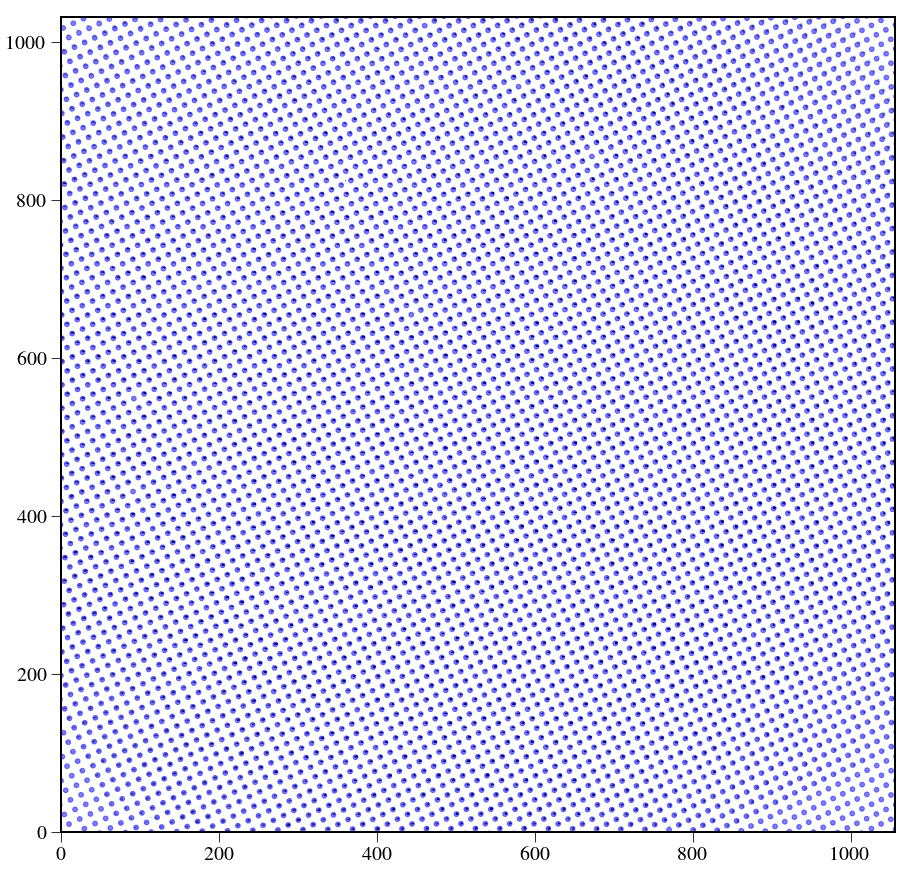

In [3]:
do_inspection(par, im.data, x, y, lamlist[9])

## Centroid each blob separately

Brute force: for loop

In [4]:
from photutils import centroid_com

dx = np.zeros_like(x)
dy = np.zeros_like(y)
size = 12
thresh = 0.2
for i in range(x.shape[0]):
    for j in range(x.shape[1]):
        if good[i,j]:
# i = 20
# j = 20
        
            xij = x[i,j]
            yij = y[i,j]
            if xij>size//2+1 and yij>size//2+1:
                xmin = int(round(xij)-size//2)
                xmax = xmin+size
                ymin = int(round(yij)-size//2)
                ymax = ymin+size
    #             print xmin,xmax,ymin,ymax
                img = im.data[ymin:ymax,xmin:xmax]
                mask = img<thresh*np.amax(img)
                ddy,ddx= centroid_com(img,mask=mask)
                dx[i,j] = ddx-size//2
                dy[i,j] = ddy-size//2
# print ddx-size//2,ddy-size//2
# plt.imshow(img)
# ms, mew = 30, 2.
# plt.plot(yij-ymin, xij-xmin, color='royalblue', marker='+', ms=ms, mew=mew)
# plt.plot(ddy, ddx, color='crimson', marker='+', ms=ms, mew=mew)


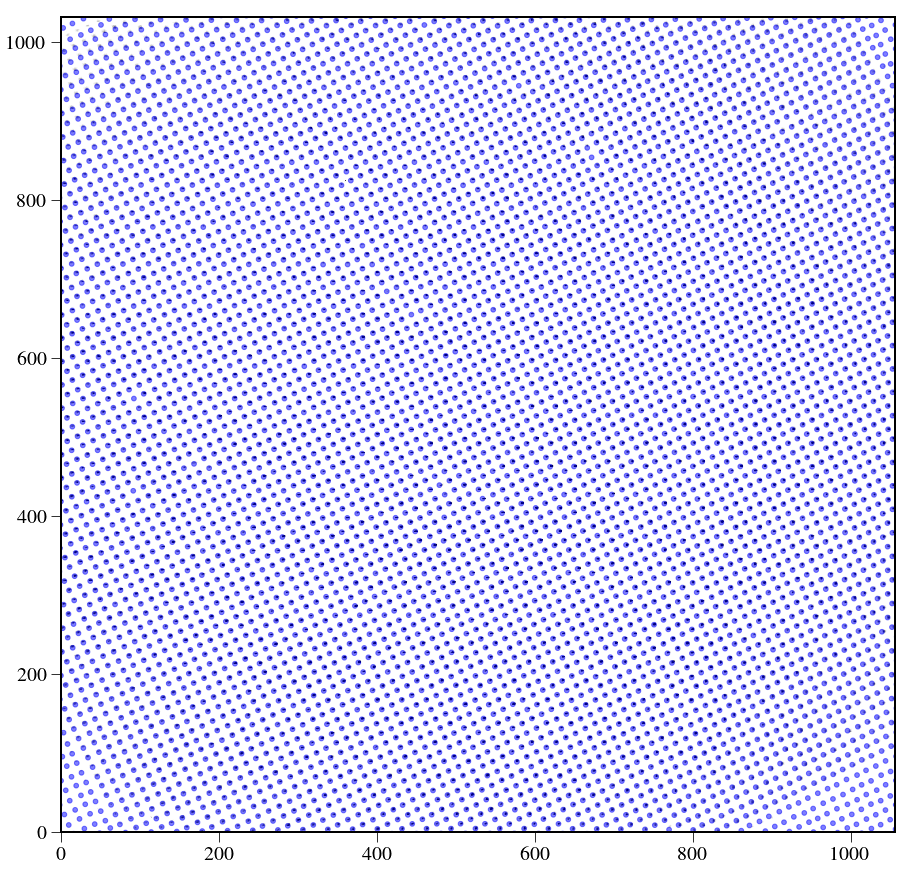

In [5]:
do_inspection(par, im.data, x+dx, y+dy, lamlist[0])

# photutils method

(2.1625546661825248, 2.0, 4.710305659273236)


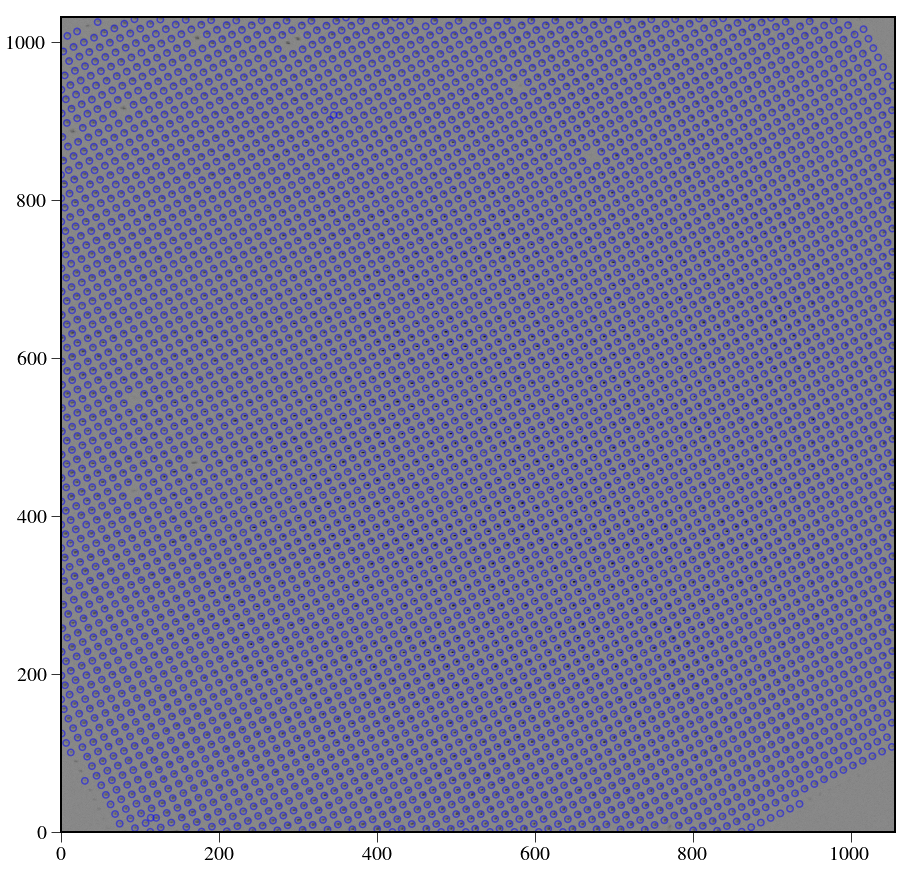

In [6]:
from photutils import DAOStarFinder
from astropy.stats import sigma_clipped_stats
mean, median, std = sigma_clipped_stats(im.data, sigma=3.0, iters=5) 
print((mean, median, std))  
daofind = DAOStarFinder(fwhm=3.0, threshold=6.*std)
sources = daofind(im.data - median)

import matplotlib.pyplot as plt
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
from photutils import CircularAperture
positions = (sources['xcentroid'], sources['ycentroid'])
apertures = CircularAperture(positions, r=4.)
norm = ImageNormalize(stretch=SqrtStretch())
fig = plt.figure(figsize=(15, 15))
plt.imshow(im.data, cmap='Greys', origin='lower', norm=norm)
apertures.plot(color='blue', lw=1.5, alpha=0.5)

fig.savefig('/Users/mrizzo/Downloads/inspection_photutils.png', dpi=300)

## Now find the centroids that are closest to the grid

### Close look at centroid

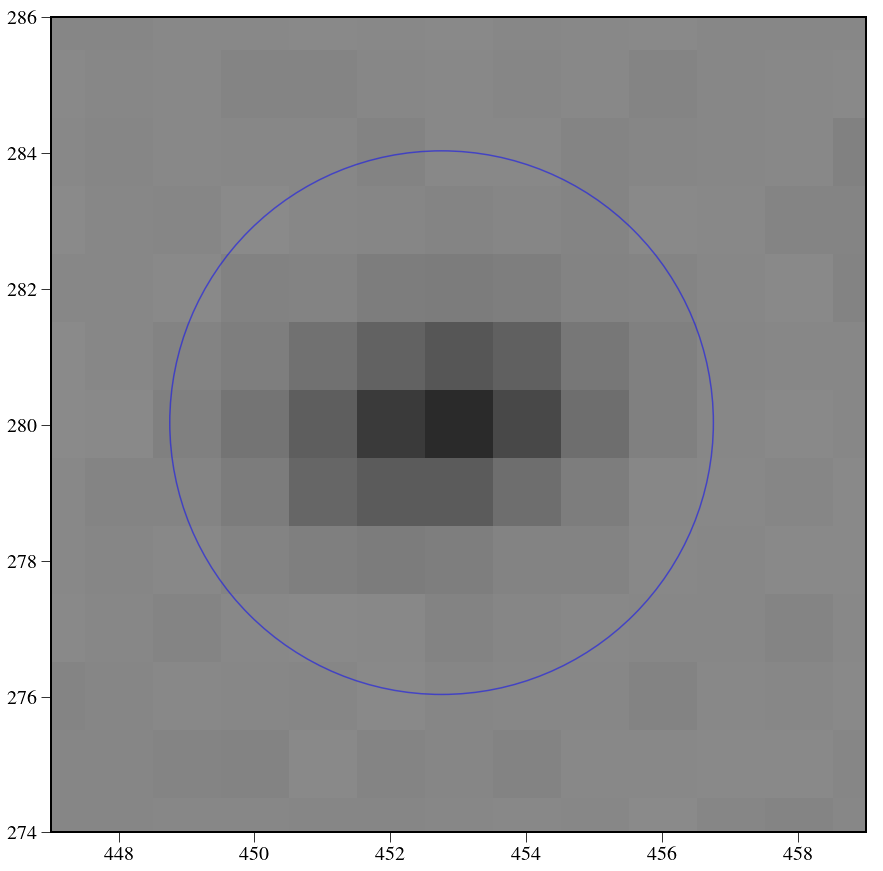

In [7]:
newx = np.zeros_like(x)
newy = np.zeros_like(x)

# for i in range(x.shape[0]):
#     for j in range(x.shape[1]):
#         if good[i,j]:
i = 40
j = 40
        
xij = x[i,j]
yij = y[i,j]
# if xij>size//2+1 and yij>size//2+1:
if xij>size//2+1 and yij>size//2+1:
    xmin = int(round(xij)-size//2)
    xmax = xmin+size
    ymin = int(round(yij)-size//2)
    ymax = ymin+size
#             print xmin,xmax,ymin,ymax
#     img = im.data[ymin:ymax,xmin:xmax]
    fig = plt.figure(figsize=(15, 15))
    plt.imshow(im.data, cmap='Greys', origin='lower', norm=norm)
    apertures.plot(color='blue', lw=1.5, alpha=0.5)

    plt.xlim([xmin,xmax])
    plt.ylim([ymin,ymax])
    

In [8]:
print(np.array(positions).shape)
pos = np.array(positions)
print x.shape

(2, 5859)
(109, 109)


In [9]:
i = 200
newx = np.zeros_like(x)
newy = np.zeros_like(y)
out = np.zeros(pos.shape[-1])
for i in range(pos.shape[-1]):
    polygrid = np.sqrt((x-pos[0,i])**2+(y-pos[1,i])**2)
    out = np.amin(polygrid)
#     plt.imshow(polygrid)
    coords = np.unravel_index(np.nanargmin(polygrid), polygrid.shape)
    if np.amin(polygrid)<2:
        newx[coords] = pos[0,i]
        newy[coords] = pos[1,i]
newx[newx==0.0] = np.nan
newy[newy==0.0] = np.nan

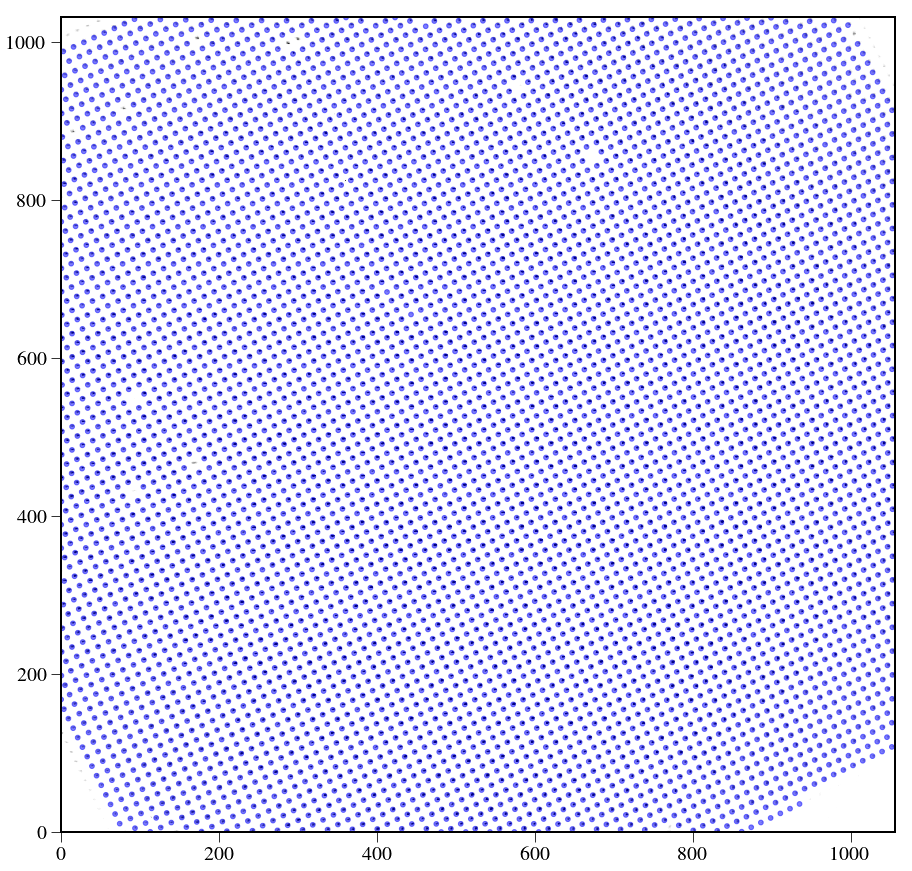

In [10]:
do_inspection(par, im.data, newx, newy, 1)

### Now need to fill the gaps

Although it probably doesn't matter much now since those gaps will be flagged by the lenslet mask

In [11]:
from scipy.interpolate import griddata
xindx = np.arange(-par.nlens / 2, par.nlens / 2+1)
xindx, yindx = np.meshgrid(xindx, xindx)

maskx = np.ma.masked_invalid(newx)
x1 = xindx[~maskx.mask]
y1 = yindx[~maskx.mask]
newarr = newx[~maskx.mask]
newx2 = griddata((x1,y1),newarr.ravel(),(xindx,yindx), method='cubic')

masky = np.ma.masked_invalid(newy)
x1 = xindx[~masky.mask]
y1 = yindx[~masky.mask]
newarr = newy[~masky.mask]
newy2 = griddata((x1,y1),newarr.ravel(),(xindx,yindx), method='cubic')


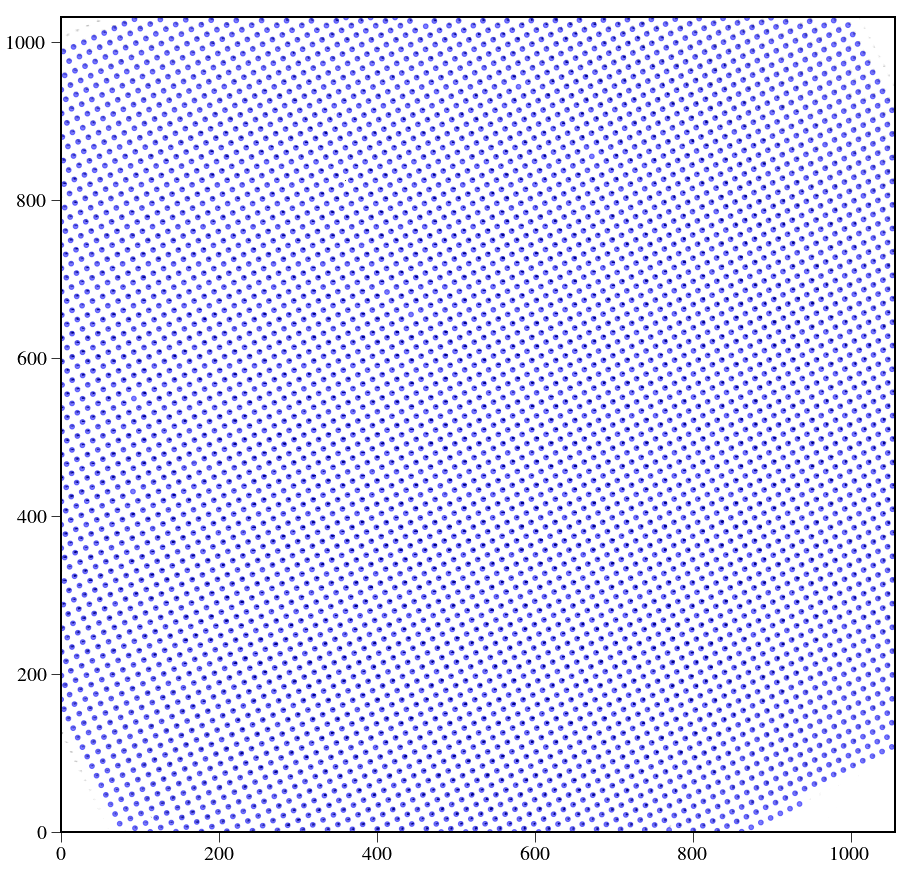

In [12]:
do_inspection(par, im.data, newx2, newy2, 1)

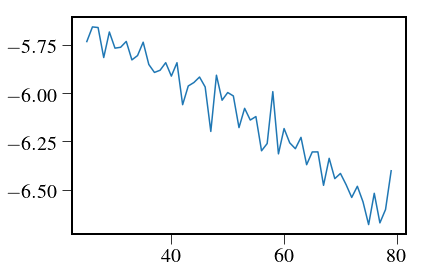

In [13]:
sliced = newx2[24,:]
plt.plot(sliced[1:]-sliced[:-1])

# Putting it all together

## Initialize with one iteration of Tim's code for now

In [3]:
from crispy.tools.locate_psflets import locatePSFlets
from crispy.tools.image import Image
par.gaussian_hires=False # since par.gaussian_hires is False, it will attempt to make high-resolution PSFLets
par.lamlist = np.arange(605.,730.,10)
par.filelist = [par.wavecalDir+'det'+str(wav)+'.fits' for wav in par.lamlist]

lamlist= par.lamlist
filelist = par.filelist

lam1 = min(lamlist)
lam2 = max(lamlist)

ysize, xsize = Image(filename=filelist[0]).data.shape
mask = np.ones((ysize, xsize))*1.0
order = 3

coef = None
allcoef = []
imlist = []

genwavelengthsol = True

for i, ifile in enumerate([filelist[0]]):
    im = Image(filename=ifile)
    im.ivar = mask
    imlist += [im]
    if genwavelengthsol:
        x, y, good, coef = locatePSFlets(im, polyorder=order, mask=mask, sig=par.FWHM / \
                                         2.35, coef=coef, phi=par.philens, scale=par.pitch / par.pixsize, nlens=par.nlens)



crispy - INFO - Read data from HDU 1 of ..//ReferenceFiles/Calibra_170425/det605.0.fits
crispy - INFO - Read data from HDU 1 of ..//ReferenceFiles/Calibra_170425/det605.0.fits
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame ..//ReferenceFiles/Calibra_170425/det605.0.fits
crispy - INFO - Array origin: (527.51617589217062, 514.89593763718574)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame ..//ReferenceFiles/Calibra_170425/det605.0.fits
crispy - INFO - Array origin: (527.40073564384159, 515.00063917251236)


## Now use the Photutils method for all wavelengths

crispy - INFO - Read data from HDU 1 of ..//ReferenceFiles/Calibra_170425/det605.0.fits
(1.7852975606661181, 1.6666666, 4.5486891138405223)
0.0
crispy - INFO - Read data from HDU 1 of ..//ReferenceFiles/Calibra_170425/det615.0.fits
(2.1281638513602763, 2.0, 4.6534002700117671)
2.10526315789
crispy - INFO - Read data from HDU 1 of ..//ReferenceFiles/Calibra_170425/det625.0.fits
(1.8978732521733286, 1.6666666, 4.5907811677485384)
2.10526315789
crispy - INFO - Read data from HDU 1 of ..//ReferenceFiles/Calibra_170425/det635.0.fits
(1.9568034072485887, 1.6666666, 4.5996239984159057)
2.10526315789


KeyboardInterrupt: 

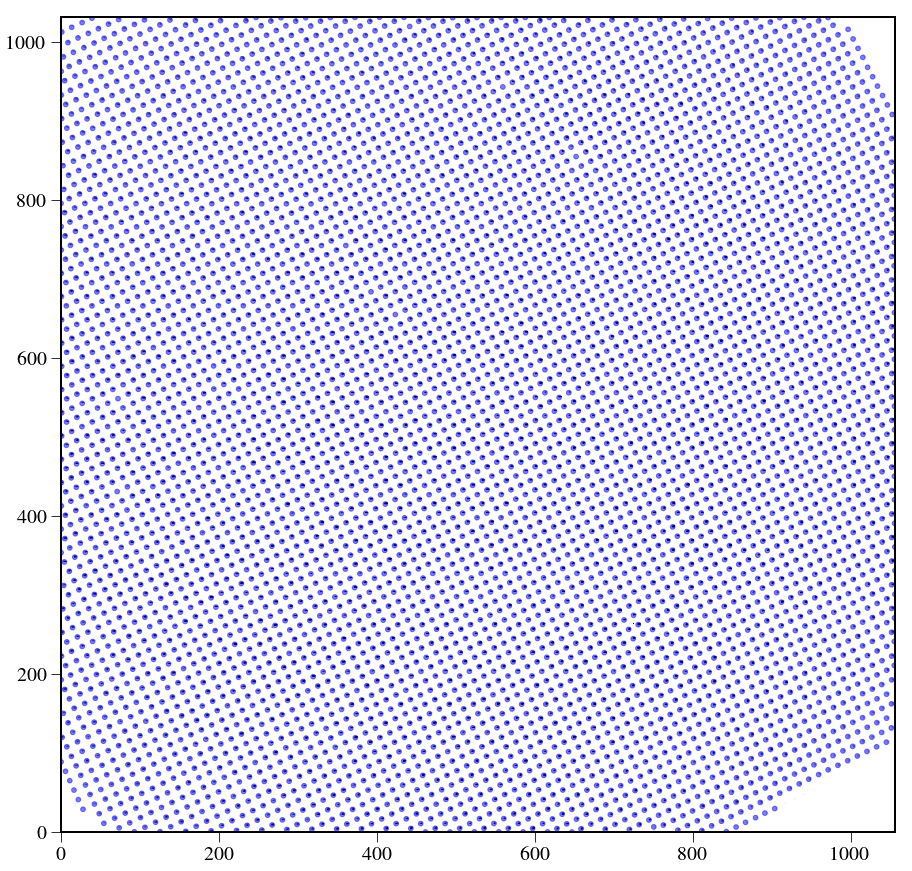

ValueError: object too deep for desired array

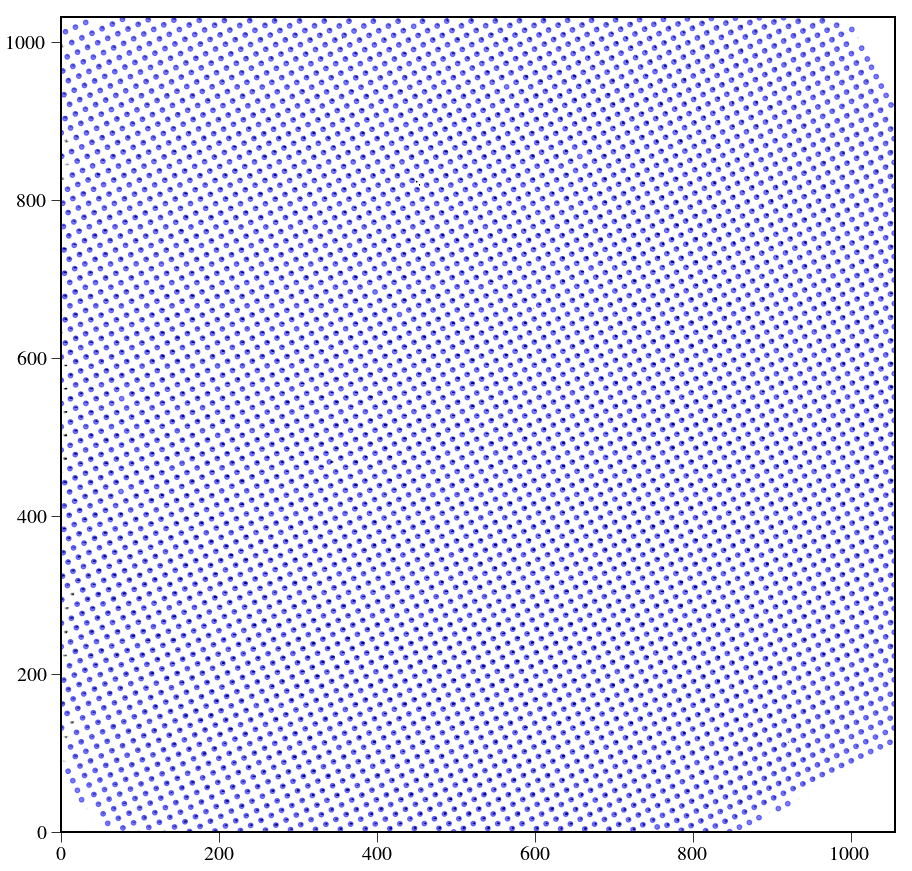

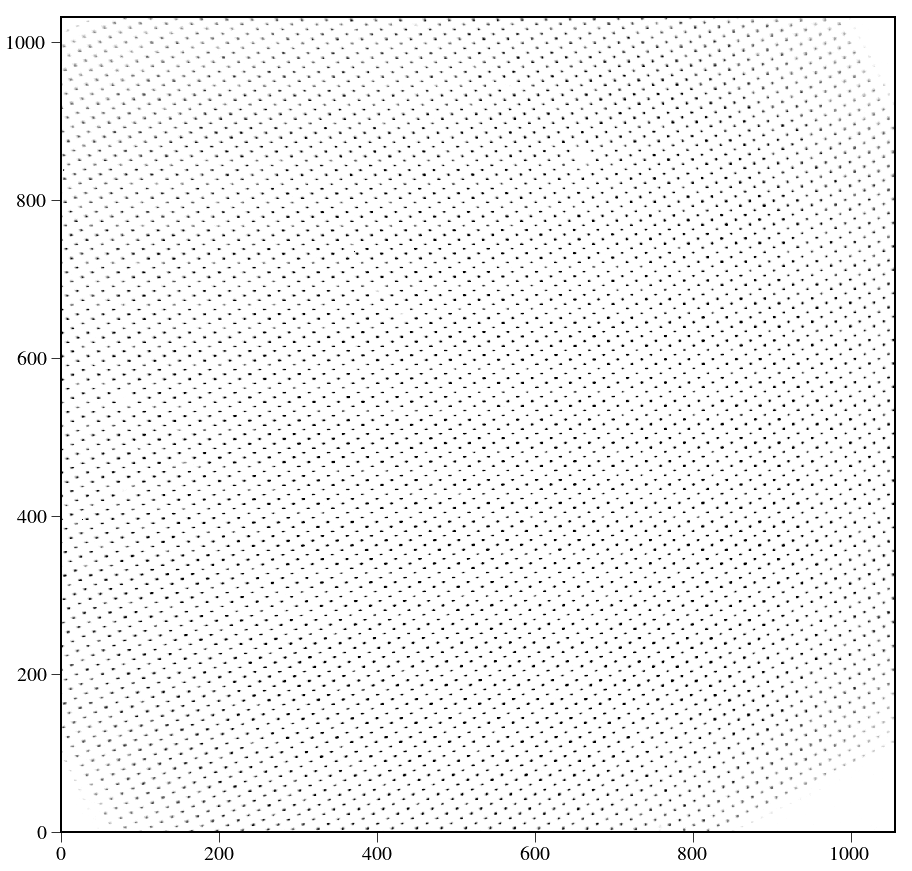

In [15]:
from photutils import DAOStarFinder
from astropy.stats import sigma_clipped_stats
import matplotlib.pyplot as plt
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
from photutils import CircularAperture
from scipy.interpolate import griddata

xlist = [x]
ylist = [y]

dlamperpix = lamlist[len(lamlist)//2]/70./2.

for i, ifile in enumerate(filelist):
    im = Image(filename=ifile)
    mean, median, std = sigma_clipped_stats(im.data, sigma=3.0, iters=5) 
    print((mean, median, std))  
    daofind = DAOStarFinder(fwhm=3.0, threshold=5.*std)
    sources = daofind(im.data - median)

    positions = (sources['xcentroid'], sources['ycentroid'])
    pos = np.array(positions)
    
    # optional plotting
#     apertures = CircularAperture(positions, r=4.)
#     norm = ImageNormalize(stretch=SqrtStretch())
#     fig = plt.figure(figsize=(15, 15))
#     plt.imshow(im.data, cmap='Greys', origin='lower', norm=norm)
#     apertures.plot(color='blue', lw=1.5, alpha=0.5)
#     fig.savefig('/Users/mrizzo/Downloads/inspection_photutils_%d.png' % i, dpi=300)
    
    # start from the previous map
    newx = np.zeros_like(xlist[i])
    newy = np.zeros_like(ylist[i])
    
    if i>0: dx = (lamlist[i]-lamlist[i-1])/dlamperpix
    else: dx = 0.0
    print dx
    
    # find closest position
    for j in range(pos.shape[-1]):
        polygrid = np.sqrt((xlist[i]+dx-pos[0,j])**2+(ylist[i]-pos[1,j])**2)
    #     plt.imshow(polygrid)
        coords = np.unravel_index(np.nanargmin(polygrid), polygrid.shape)
#         if i==0 or (i>0 and np.amin(polygrid)<2):
        newx[coords] = pos[0,j]
        newy[coords] = pos[1,j]
    newx[newx==0.0] = np.nan
    newy[newy==0.0] = np.nan
    
    # fill gaps if any
    xindx = np.arange(-par.nlens / 2, par.nlens / 2+1)
    xindx, yindx = np.meshgrid(xindx, xindx)

    maskx = np.ma.masked_invalid(newx)
    x1 = xindx[~maskx.mask]
    y1 = yindx[~maskx.mask]
    newarr = newx[~maskx.mask]
    newx2 = griddata((x1,y1),newarr.ravel(),(xindx,yindx), method='cubic')

    masky = np.ma.masked_invalid(newy)
    x1 = xindx[~masky.mask]
    y1 = yindx[~masky.mask]
    newarr = newy[~masky.mask]
    newy2 = griddata((x1,y1),newarr.ravel(),(xindx,yindx), method='cubic')

    xlist.append(newx2)
    ylist.append(newy2)
    do_inspection(par, im.data, newx2, newy2, i)

In [ ]:
xlistarr = np.array(xlist[1:])
ylistarr = np.array(ylist[1:])


In [ ]:
print xlistarr.shape
plt.plot(lamlist,ylistarr[:,50,50])

## Summary of Photutils method

It seems to work fine, except for a few lenslets what are confused by bright nearby spots. Also, the lenslets to the left, which come into the field only for longer wavelengths, are not populated. It appears that constraining everything to a 2D polynomial is still the way to go to get started on all iterations. Hence, let's explore a method where we run Tim's calibration, but for each step we do our photutils improvement.

## Polynomial fit + photutils detailed centroiding

In [ ]:
from crispy.tools.locate_psflets import locatePSFlets
from crispy.tools.image import Image
from photutils import DAOStarFinder
from astropy.stats import sigma_clipped_stats
import matplotlib.pyplot as plt
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
from photutils import CircularAperture
from scipy.interpolate import griddata

par.lamlist = np.arange(605.,730.,10)
par.filelist = [par.wavecalDir+'det'+str(wav)+'.fits' for wav in par.lamlist]

lamlist= par.lamlist
filelist = par.filelist

lam1 = min(lamlist)
lam2 = max(lamlist)

ysize, xsize = Image(filename=filelist[0]).data.shape
mask = np.ones((ysize, xsize))*1.0
order = 3

coef = None
allcoef = []
imlist = []

xlist_Tim = []
ylist_Tim = []
xlist = []
ylist = []


genwavelengthsol = True

for i, ifile in enumerate(filelist):
    im = Image(filename=ifile)
    im.ivar = mask
    imlist += [im]
    
    ## First off, use Tim's calibration code
    x, y, good, coef = locatePSFlets(im, polyorder=order, mask=mask, sig=par.FWHM / \
                                     2.35, coef=coef, phi=par.philens, scale=par.pitch / par.pixsize, nlens=par.nlens)
    allcoef += [[lamlist[i]] + list(coef)]
    xlist_Tim.append(x)
    ylist_Tim.append(y)
    
    ## Second, use photutils to do a fine centroiding around the spots found by Tim's routine
    mean, median, std = sigma_clipped_stats(im.data, sigma=3.0, iters=5) 
    print((mean, median, std))  
    daofind = DAOStarFinder(fwhm=3.0, threshold=5.*std)
    sources = daofind(im.data - median)

    positions = (sources['xcentroid'], sources['ycentroid'])
    pos = np.array(positions)
        
    # start from the previous map
    newx = np.zeros_like(x)
    newy = np.zeros_like(y)
       
    # find closest position
    for j in range(pos.shape[-1]):
        polygrid = np.sqrt((x-pos[0,j])**2+(y-pos[1,j])**2)
        coords = np.unravel_index(np.nanargmin(polygrid), polygrid.shape)
#         if i==0 or (i>0 and np.amin(polygrid)<2):
        if np.amin(polygrid)<2:
            newx[coords] = pos[0,j]
            newy[coords] = pos[1,j]
    newx[newx==0.0] = np.nan
    newy[newy==0.0] = np.nan
    
    # fill gaps if any
    xindx = np.arange(-par.nlens / 2, par.nlens / 2+1)
    xindx, yindx = np.meshgrid(xindx, xindx)

    maskx = np.ma.masked_invalid(newx)
    x1 = xindx[~maskx.mask]
    y1 = yindx[~maskx.mask]
    newarr = newx[~maskx.mask]
    newx2 = griddata((x1,y1),newarr.ravel(),(xindx,yindx), method='cubic')

    masky = np.ma.masked_invalid(newy)
    x1 = xindx[~masky.mask]
    y1 = yindx[~masky.mask]
    newarr = newy[~masky.mask]
    newy2 = griddata((x1,y1),newarr.ravel(),(xindx,yindx), method='cubic')

    xlist.append(newx2)
    ylist.append(newy2)
    do_inspection(par, im.data, newx2, newy2, i)

xlistarr = np.array(xlist)
ylistarr = np.array(ylist)
out = fits.HDUList(fits.PrimaryHDU(xlistarr.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/xlistarr.fits',overwrite=True)
out = fits.HDUList(fits.PrimaryHDU(ylistarr.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/ylistarr.fits',overwrite=True)


### Notes/inspection

Things went much better after putting in a threshold of 2 pixels beyond which nearby spots were not selected.

In [ ]:
plt.plot(lamlist,xlistarr[:,50,50])
plt.plot(lamlist,xlistarr[:,51,50])
plt.plot(lamlist,xlistarr[:,52,50])


In [ ]:
plt.imshow(ylistarr[5])

In [ ]:
i = 40
j = 40
mean, median, std = sigma_clipped_stats(im.data, sigma=3.0, iters=5)
apertures = CircularAperture(positions, r=4.)
size=100
xij = x[i,j]
yij = y[i,j]
# if xij>size//2+1 and yij>size//2+1:
if xij>size//2+1 and yij>size//2+1:
    xmin = int(round(xij)-size//2)
    xmax = xmin+size
    ymin = int(round(yij)-size//2)
    ymax = ymin+size
#             print xmin,xmax,ymin,ymax
#     img = im.data[ymin:ymax,xmin:xmax]
    fig,ax = plt.subplots(figsize=(15, 15))    
    
    xg, yg = x.shape
    vals = np.array([(x[m, n], y[m, n])
                     for m in range(xg) for n in range(yg)])
    pos = (vals[:, 0], vals[:, 1])
    norm = mpl.colors.Normalize(vmin=mean, vmax=mean + 5 * std)
    ax.imshow(im.data, cmap='Greys', origin='lower', norm=norm)
    apertures.plot(color='red', lw=1.5, alpha=0.5)
    for val in vals:
        circle = plt.Circle(val, 4, color='blue', lw=1, alpha=0.5)
        ax.add_artist(circle)


    ax.set_xlim([xmin,xmax])
    ax.set_ylim([ymin,ymax])


In [ ]:
i = 54
j = 54
apertures = CircularAperture(positions, r=4.)
size=50
xij = x[i,j]
yij = y[i,j]
print xij,yij
# if xij>size//2+1 and yij>size//2+1:
if xij>size//2+1 and yij>size//2+1:
    xmin = int(round(xij)-size//2)
    xmax = xmin+size
    ymin = int(round(yij)-size//2)
    ymax = ymin+size
#             print xmin,xmax,ymin,ymax
#     img = im.data[ymin:ymax,xmin:xmax]
    fig,ax = plt.subplots(figsize=(15, 15))    
    
    xg, yg = x.shape
    vals = np.array([(x[m, n], y[m, n])
                     for m in range(xg) for n in range(yg)])
    pos = (vals[:, 0], vals[:, 1])
    norm = mpl.colors.Normalize(vmin=mean, vmax=mean + 5 * std)
    ax.imshow(im.data, cmap='Greys', origin='lower', norm=norm)
    apertures.plot(color='red', lw=1.5, alpha=0.5)
    for val in vals:
        circle = plt.Circle(val, 4, color='blue', lw=1, alpha=0.5)
        ax.add_artist(circle)
#     ax.text((xij,yij),"test")

    ax.set_xlim([500,600])
    ax.set_ylim([500,600])


In [49]:
newx = np.zeros_like(x)
newy = np.zeros_like(y)
pos = np.array(positions)
out = np.zeros(pos.shape[-1])
for i in range(pos.shape[-1]):
    polygrid = np.sqrt((x-pos[0,i])**2+(y-pos[1,i])**2)
    out[i] = np.amin(polygrid)
#     plt.imshow(polygrid)
    coords = np.unravel_index(np.nanargmin(polygrid), polygrid.shape)
    if np.amin(polygrid)<2:
        newx[coords] = pos[0,i]
        newy[coords] = pos[1,i]
newx[newx==0.0] = np.nan
newy[newy==0.0] = np.nan

NameError: name 'positions' is not defined

In [ ]:
plt.figure(figsize=(10,10))
plt.hist(out,bins=100,range=[0,2])
plt.title('Histogram of centroid differences between CHARIS and CHARIS+DAOFIND')

# Interpolate in wavelength

The purpose of this section is to take the output of the fine calibration and interpolate it to yield the x,y arrays for any arbitrary wavelength

In [ ]:
xlistarr = fits.getdata('/Users/mrizzo/Downloads/xlistarr.fits')
ylistarr = fits.getdata('/Users/mrizzo/Downloads/ylistarr.fits')
from scipy import interpolate
testarray = xlistarr[:,0,0]
print testarray
par.lamlist = np.arange(605.,730.,10)
lamlist= par.lamlist
tck = interpolate.splrep(lamlist, testarray)

In [ ]:
ynew = interpolate.splev(lamlist, tck, der=0)
print ynew


In [ ]:
lams=[640,655,654,678,714]
img = np.zeros((len(lams),xlistarr.shape[1],xlistarr.shape[2]))

for i in range(xlistarr.shape[1]):
    for j in range(xlistarr.shape[2]):
        tck = interpolate.splrep(lamlist, xlistarr[:,i,j])
        img[:,i,j] = interpolate.splev(lams, tck, der=0)

In [ ]:
plt.imshow(img[1])

In [ ]:
cal = np.empty((xlistarr.shape[1],xlistarr.shape[2]))

In [ ]:
out = fits.HDUList(fits.PrimaryHDU(xlistarr.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/xlistarr.fits',overwrite=True)
out = fits.HDUList(fits.PrimaryHDU(ylistarr.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/ylistarr.fits',overwrite=True)


# Genpixsol

In [35]:
lamc=660.
# lamlist = np.arange(lamc*(1.-par.BW/2.),lamc*(1.+par.BW/2.)+5.,5.)
lamlist = np.arange(605.,730.,10)
print min(lamlist),max(lamlist)
lam1=min(lamlist)
lam2 = max(lamlist)
wavecalDir = '..//ReferenceFiles/Calibra_170425/'

605.0 725.0


In [36]:


xindx = np.arange(-108 / 2, 108 / 2 + 1)
xindx, yindx = np.meshgrid(xindx, xindx)

n_spline = 100

interp_x = np.zeros(tuple([n_spline] + list(xindx.shape)))
interp_y = np.zeros(interp_x.shape)
interp_lam = np.linspace(lam1, lam2, n_spline)

xlistarr = fits.getdata(wavecalDir + 'xlistarr.fits')
ylistarr = fits.getdata(wavecalDir + 'ylistarr.fits')

from crispy.tools.locate_psflets import fine_transform 

interp_x, interp_y = fine_transform(interp_lam, 
                                    xindx,
                                    yindx,
                                    lamlist,
                                    xlistarr,
                                    ylistarr)

x = np.zeros(tuple(list(xindx.shape) + [1000]))
y = np.zeros(x.shape)
nlam = np.zeros(xindx.shape, np.int)
lam_out = np.zeros(y.shape)
good = np.ones(xindx.shape)


In [47]:
from scipy import interpolate
ix = 70
iy = 82
# for ix in range(xindx.shape[0]):
#     for iy in range(xindx.shape[1]):
pix_y = interp_x[:, ix, iy]
pix_x = interp_y[:, ix, iy]
print xlistarr[:,ix, iy]
print interp_lam
tck_y = interpolate.splrep(pix_y, interp_lam)

[ 559.23016357  562.68591309  564.13049316  567.61975098  568.64593506
  570.82324219  574.53424072  576.4241333   578.7565918   580.77410889
  582.68023682  584.86016846  584.73394775]
[ 605.          606.21212121  607.42424242  608.63636364  609.84848485
  611.06060606  612.27272727  613.48484848  614.6969697   615.90909091
  617.12121212  618.33333333  619.54545455  620.75757576  621.96969697
  623.18181818  624.39393939  625.60606061  626.81818182  628.03030303
  629.24242424  630.45454545  631.66666667  632.87878788  634.09090909
  635.3030303   636.51515152  637.72727273  638.93939394  640.15151515
  641.36363636  642.57575758  643.78787879  645.          646.21212121
  647.42424242  648.63636364  649.84848485  651.06060606  652.27272727
  653.48484848  654.6969697   655.90909091  657.12121212  658.33333333
  659.54545455  660.75757576  661.96969697  663.18181818  664.39393939
  665.60606061  666.81818182  668.03030303  669.24242424  670.45454545
  671.66666667  672.87878788  674

ValueError: Error on input data

In [48]:
borderpix=5
for ix in range(xindx.shape[0]):
    for iy in range(xindx.shape[1]):
        pix_y = interp_x[:, ix, iy]
        pix_x = interp_y[:, ix, iy]

        if np.any(
                pix_x < borderpix) or np.any(
                pix_x > par.npix -
                borderpix) or np.any(
                pix_y < borderpix) or np.any(
                pix_y > par.npix -
                borderpix) or np.any(
                np.isnan(pix_y)) or np.any(
                np.isnan(pix_x)):
                good[ix, iy] = 0
                continue
        try:
            tck_y = interpolate.splrep(pix_y, interp_lam)
        except:
            print ix,iy


70 82


# Attempt polynomial fit with improved centroids

crispy - INFO - The number of input pixels per lenslet is 5.000000
crispy - INFO - Using PSFlet gaussian approximation
crispy - WARNING - Assuming slices are evenly spread in wavelengths
crispy - INFO - Creating Gaussian PSFLet templates
crispy - INFO - Writing data to ..//SimResults/imagePlaneRot.fits
crispy - INFO - Writing data to ..//SimResults/detectorFramepoly.fits
crispy - INFO - Writing data to ..//SimResults/detectorFrame.fits
crispy - INFO - Done.
crispy - INFO - Performance: 6 seconds total
crispy - INFO - Writing data to /Users/mrizzo/Downloads/det_660_fwhm=2.fits


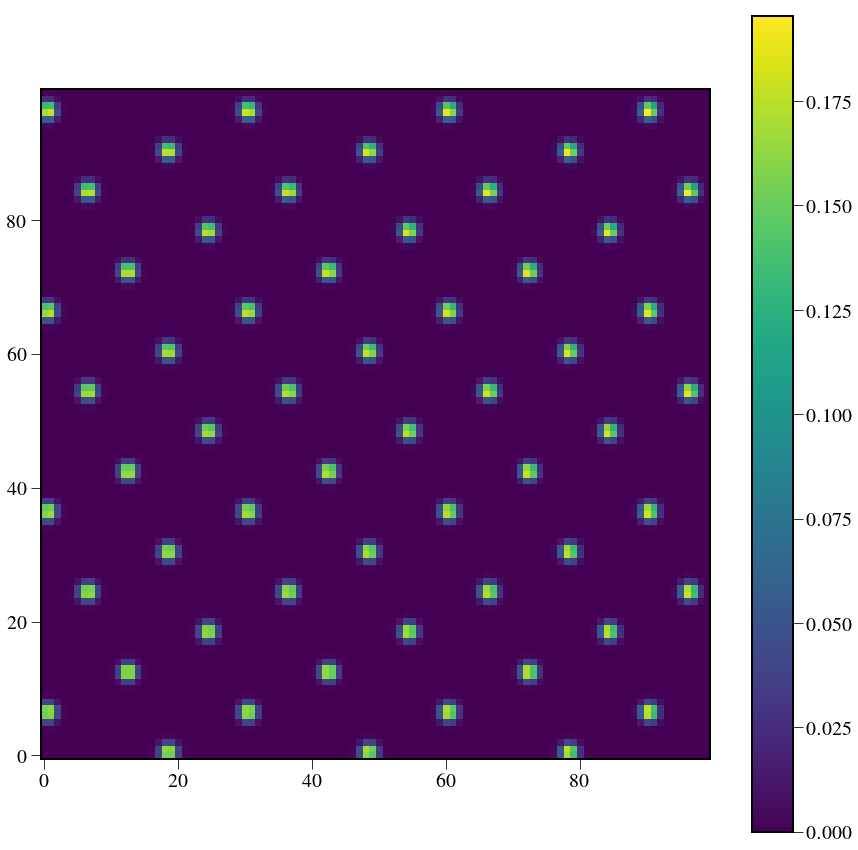

In [ ]:
from crispy.IFS import polychromeIFS,getQE
from crispy.tools.image import Image
lam = 660.
inputCube = np.ones((1, 1024, 1024), dtype=float)
inCube = fits.HDUList(fits.PrimaryHDU(inputCube))
inCube[0].header['LAM_C'] = 0.66
inCube[0].header['PIXSIZE'] = 0.1
filelist = []
par.FWHM=2.0
x0=0.0
dlam = 1./(getQE(par,lam)*(par.lenslet_sampling/inCube[0].header['PIXSIZE'])**2)  # this normalizes the image so that each lenslet has a volume of 1
par.saveRotatedInput=True
detectorFrame = polychromeIFS(
    par,
    [lam],
    inCube[0],
    dlambda=dlam,
    parallel=False,
    dx=x0)
filename = '/Users/mrizzo/Downloads/det_%3d_fwhm=%d.fits' % (lam,int(par.FWHM))
Image(data=detectorFrame, header=par.hdr).write(filename)
plt.figure(figsize=(15,15))
plt.imshow(detectorFrame[500:600,500:600])
plt.colorbar()

In [7]:
xlistarr = fits.getdata(par.wavecalDir+'xlistarr.fits')
ylistarr = fits.getdata(par.wavecalDir+'ylistarr.fits')
xindx = np.arange(-par.nlens / 2, par.nlens / 2)
xindx, yindx = np.meshgrid(xindx, xindx)


In [8]:
missing = np.isnan(xlistarr[0])
X = np.reshape(xindx[~missing],-1)
Y = np.reshape(yindx[~missing],-1)
# third-order polynomial least squares fit
# could even add weights for each centroid to minimize residuals
A = np.array([np.ones_like(X), X, Y, X**2, X**2*Y, X**2*Y**2, Y**2, X*Y**2, X*Y]).T
B = np.reshape(xlistarr[0][~missing],-1)
print A.shape,B.shape
coeffx, r, rank, s = np.linalg.lstsq(A, B)
xcoords = np.zeros_like(ylistarr[0])
xcoords[missing] = np.NaN
xcoords[~missing] = np.reshape(np.dot(A,coeffx),xlistarr[0][~missing].shape)


print np.sum((xlistarr[0][~missing]-xcoords[~missing])**2/(0.08)**2)/len(xcoords[~missing])

missing = np.isnan(ylistarr[0])
X = np.reshape(xindx[~missing],-1)
Y = np.reshape(yindx[~missing],-1)
A = np.array([np.ones_like(X), X, Y, X**2, X**2*Y, X**2*Y**2, Y**2, X*Y**2, X*Y]).T
B = np.reshape(ylistarr[0][~missing],-1)
print A.shape,B.shape
coeffy, r, rank, s = np.linalg.lstsq(A, B)
ycoords = np.zeros_like(ylistarr[0])
ycoords[missing] = np.NaN
ycoords[~missing] = np.reshape(np.dot(A,coeffy),ylistarr[0][~missing].shape)


(5881, 9) (5881,)
2.15376168355
(5881, 9) (5881,)


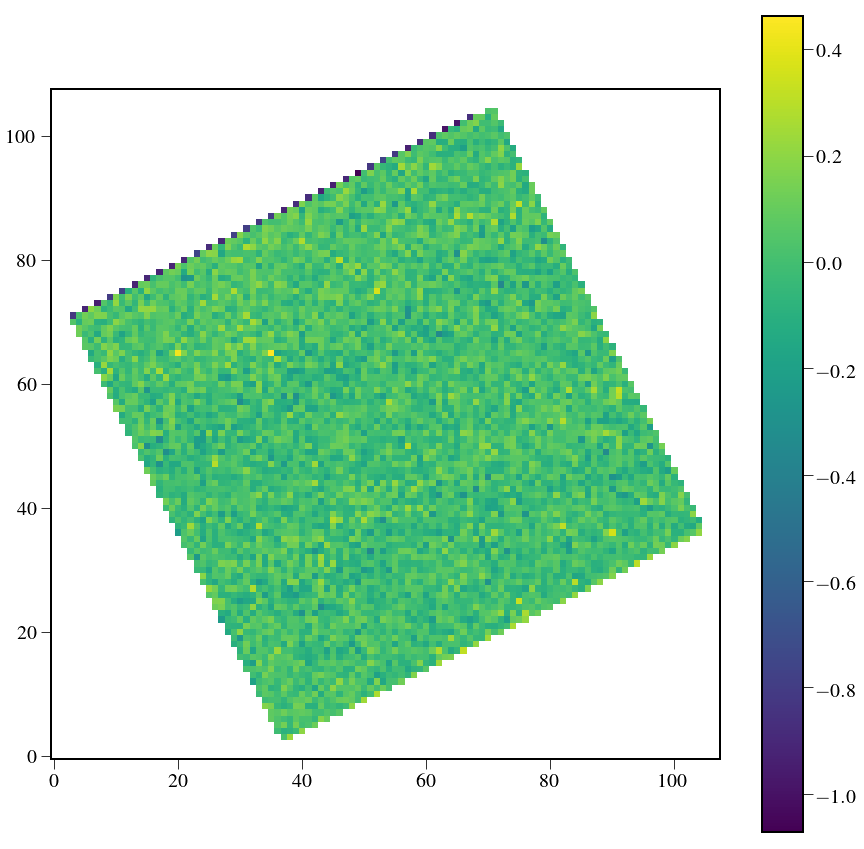

In [9]:
plt.figure(figsize=(15,15))
plt.imshow(xlistarr[0]-xcoords)
plt.colorbar()

In [8]:
dat = fits.getdata(par.wavecalDir+'det_600.fits')

In [ ]:
import matplotlib as mpl
def do_inspection(par, image, xpos, ypos, lam):

    xg, yg = xpos.shape
    vals = np.array([(xpos[m, n], ypos[m, n])
                     for m in range(xg) for n in range(yg)])
    pos = (vals[:, 0], vals[:, 1])
    fig, ax = plt.subplots(figsize=(15, 15))
    mean = np.mean(image)
    std = np.std(image)
    norm = mpl.colors.Normalize(vmin=mean, vmax=mean + 5 * std)
    ax.imshow(
        image,
        cmap='Greys',
        norm=norm,
        interpolation='nearest',
        origin='lower')
    for val in vals:
        circle = plt.Circle(val, 3, color='blue', lw=1, alpha=0.5)
        ax.add_artist(circle)
    fig.savefig('/Users/mrizzo/Downloads/test_%3d.png' % (lam), dpi=300)

# do_inspection(par,dat,xlistarr[0],ylistarr[0],600)
do_inspection(par,dat,xcoords,ycoords,601)

# SNR on grid fit

## Create a grid of PSFLets

crispy - INFO - The number of input pixels per lenslet is 5.000000
crispy - INFO - Using PSFlet gaussian approximation
crispy - WARNING - Assuming slices are evenly spread in wavelengths
crispy - INFO - Creating Gaussian PSFLet templates
crispy - INFO - Writing data to ..//SimResults/imagePlaneRot.fits
crispy - INFO - Writing data to ..//SimResults/detectorFramepoly.fits
crispy - INFO - Writing data to ..//SimResults/detectorFrame.fits
crispy - INFO - Done.
crispy - INFO - Performance: 6 seconds total
crispy - INFO - Writing data to /Users/mrizzo/Downloads/det_660_fwhm=2.fits


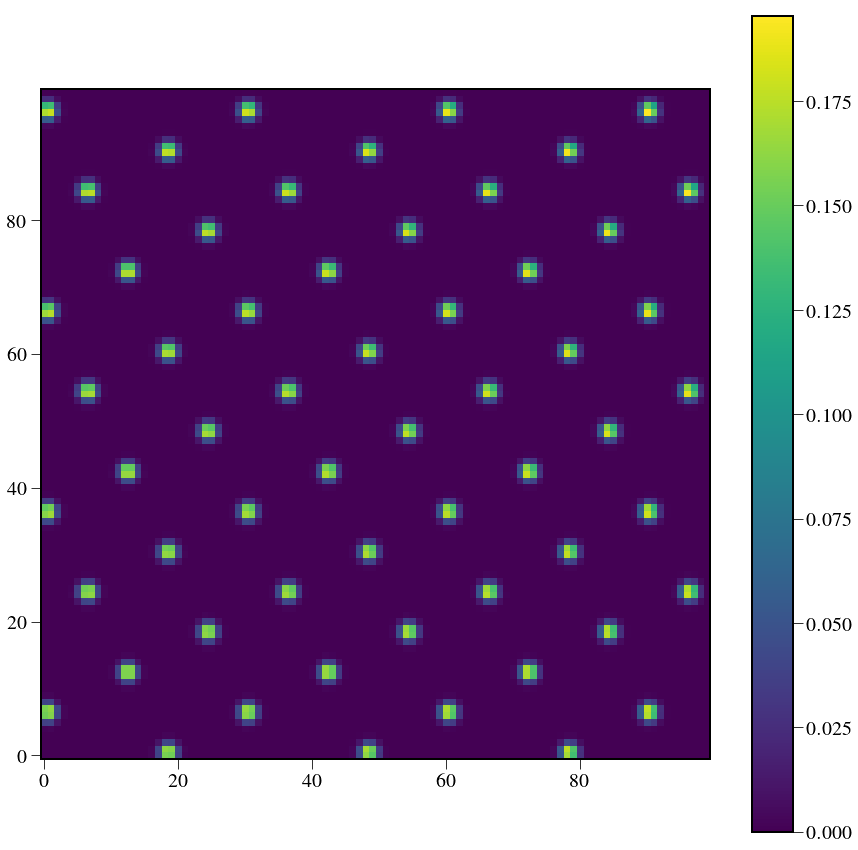

In [ ]:
import os
os.chdir('/Users/mrizzo/IFS/crispy/crispy/WFIRST/')
from params import Params
par = Params()
par.hdr

from crispy.IFS import polychromeIFS,getQE
from crispy.tools.image import Image
lam = 660.
inputCube = np.ones((1, 1024, 1024), dtype=float)
inCube = fits.HDUList(fits.PrimaryHDU(inputCube))
inCube[0].header['LAM_C'] = 0.66
inCube[0].header['PIXSIZE'] = 0.1
filelist = []
par.FWHM=2.0
x0=0.0
dlam = 1./(getQE(par,lam)*(par.lenslet_sampling/inCube[0].header['PIXSIZE'])**2)  # this normalizes the image so that each lenslet has a volume of 1
par.saveRotatedInput=True
detectorFrame = polychromeIFS(
    par,
    [lam],
    inCube[0],
    dlambda=dlam,
    parallel=False,
    dx=x0)
filename = '/Users/mrizzo/Downloads/det_%3d_fwhm=%d.fits' % (lam,int(par.FWHM))
Image(data=detectorFrame, header=par.hdr).write(filename)
plt.figure(figsize=(15,15))
plt.imshow(detectorFrame[500:600,500:600])
plt.colorbar()

In [32]:
print par.pxperdetpix

1


## initial positions

In [3]:
from crispy.tools.locate_psflets import initcoef,transform,locatePSFlets
order=3
xindx = np.arange(-108 / 2, 108 / 2)
xindx, yindx = np.meshgrid(xindx, xindx)

dispersion = 0.0
print dispersion
coef = initcoef(
    order,
    scale=par.pitch / par.pixsize,
    phi=par.philens,
    x0=par.npix // 2 + x0,
    y0=par.npix // 2 + dispersion)
xcen, ycen = transform(xindx, yindx, order, coef)


0.0


In [58]:
from crispy.tools.imgtools import gausspsf
psf = gausspsf(offx=0.3)
print np.amax(psf)

0.185799442536


## Practice with create noisy image and ensure SNR

crispy - INFO - Read data from HDU 1 of /Users/mrizzo/Downloads/det_660_fwhm=2.fits
10.1652516846 10.0 3.21064922073


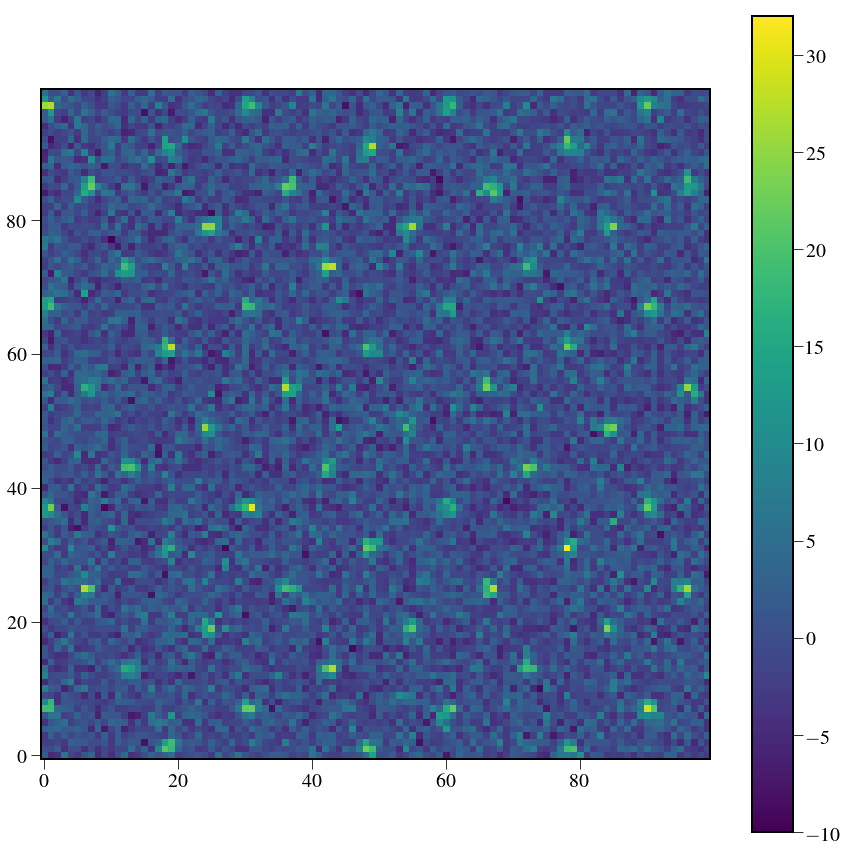

In [4]:
from crispy.tools.image import Image
from photutils import DAOStarFinder
from astropy.stats import sigma_clipped_stats
lam = 660.
filename = '/Users/mrizzo/Downloads/det_%3d_fwhm=%d.fits' % (lam,int(par.FWHM))
detectorFrame = Image(filename=filename).data
flux = 100
bkgd = 10
noisy = np.random.poisson(flux*detectorFrame+bkgd)
mean, median, std = sigma_clipped_stats(noisy, sigma=3.0, iters=5)
daofind = DAOStarFinder(fwhm=2.0, threshold=5.*std)
sources = daofind(noisy - median)


print mean, median, std
plt.figure(figsize=(15,15))
plt.imshow(noisy[500:600,500:600]-median)
plt.colorbar()

In [7]:
from photutils import aperture_photometry,CircularAperture
sources['Phot']=sources['flux']*5*std/0.185
positions = (sources['xcentroid'], sources['ycentroid'])
apertures = CircularAperture(positions, r=3.)
phot_table = aperture_photometry(noisy-median, apertures)
phot_table = phot_table[phot_table['aperture_sum']>flux/3.]
# phot_table.show_in_notebook()

### Verify SNR through aperture photometry

In [8]:
print np.mean(phot_table['aperture_sum']),np.std(phot_table['aperture_sum']),np.sqrt(flux+sources['npix'][0]*std**2)


101.049451945 18.6027795521 18.9247482146


(array([   1.,    0.,    0.,    0.,    3.,    0.,    4.,    2.,    3.,
           6.,    6.,    7.,    2.,   10.,    9.,    3.,   12.,   19.,
          21.,   26.,   21.,   29.,   33.,   28.,   39.,   45.,   43.,
          48.,   76.,   80.,   52.,   76.,   80.,   83.,  104.,   82.,
          90.,  114.,  112.,  104.,  121.,  128.,  129.,  127.,  145.,
         128.,  134.,  133.,  133.,  127.,  129.,  140.,  116.,  104.,
         108.,  108.,  106.,  113.,   87.,   71.,   85.,   64.,   69.,
          60.,   45.,   51.,   60.,   50.,   48.,   32.,   33.,   29.,
          20.,   22.,   16.,   14.,   20.,   11.,   13.,   11.,    9.,
           6.,    6.,    6.,    2.,    3.,    1.,    4.,    2.,    0.,
           1.,    1.,    1.,    0.,    2.,    0.,    0.,    1.,    0.,    1.]),
 array([  43.30702353,   44.6354503 ,   45.96387707,   47.29230384,
          48.62073061,   49.94915738,   51.27758415,   52.60601092,
          53.93443769,   55.26286446,   56.59129123,   57.919718  ,
      

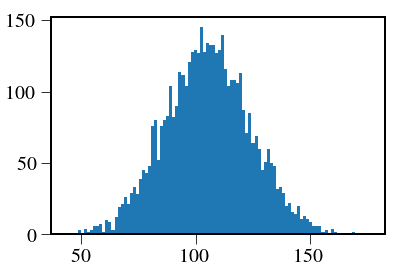

In [137]:
# plt.hist(sources['Phot'],bins=100)
plt.hist(phot_table['aperture_sum'],bins=100)

In [60]:
sources.show_in_notebook()

idx,id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag,Phot
0,1,3.6557551771,4.08596793405,0.624022296508,-0.198234674872,-0.111597961191,25.0,0.0,78.0,4.92331399754,-1.73064383737,416.457661942
1,2,33.551597013,4.03766959168,0.793189939527,-0.360989905568,-0.300464540105,25.0,0.0,85.0,4.65040018773,-1.6687258187,393.372185939
2,3,63.5434191013,4.04704256119,0.669941902797,-0.0408769371996,-0.047333254699,25.0,0.0,87.0,5.26685304384,-1.80387800202,445.517248245
3,4,93.5453269496,4.05250486895,0.732610573601,-0.210111447339,-0.383815981243,25.0,0.0,81.0,4.62419534885,-1.66259043136,391.155547728
4,5,123.713618577,4.02156398925,0.727080221681,-0.200765559921,-0.190764946735,25.0,0.0,73.0,4.06526530979,-1.52272223511,343.876276617
5,6,153.411604228,4.02126455356,0.5258401222,-0.0629433690032,-0.0286021683357,25.0,0.0,63.0,4.07964601406,-1.5265562038,345.092724416
6,7,183.383399342,3.99701517885,0.623354371564,0.0674803977043,-0.256829403047,25.0,0.0,66.0,4.12662298132,-1.53898698113,349.066453892
7,8,213.235710275,4.06213212512,0.776065596672,0.192137576939,0.0372535016251,25.0,0.0,92.0,5.14701384164,-1.77888834045,435.380183256
8,9,243.146780411,4.15042932002,0.708551108461,-0.0445933673629,-0.0352875798833,25.0,0.0,79.0,4.55516796838,-1.64626098971,385.316598294
9,10,273.094866984,3.98677379336,0.789994959677,-0.0619547154134,-0.129353849198,25.0,0.0,101.0,5.5477561338,-1.86029340566,469.27852858


## Run calibration

10.0800164348 10.0 3.17156754608


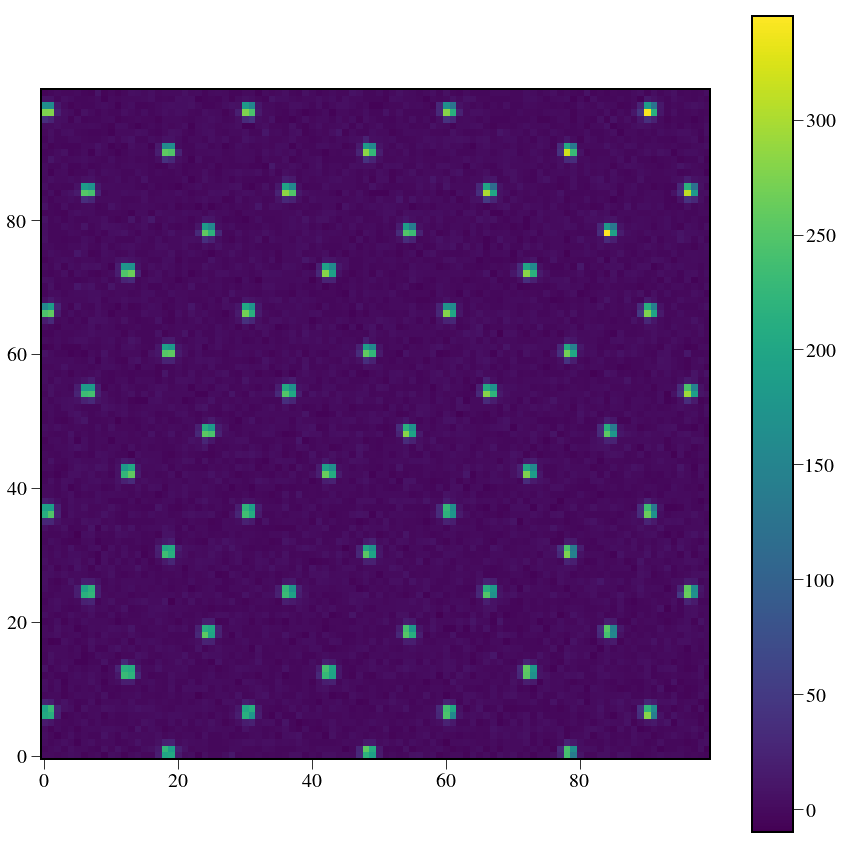

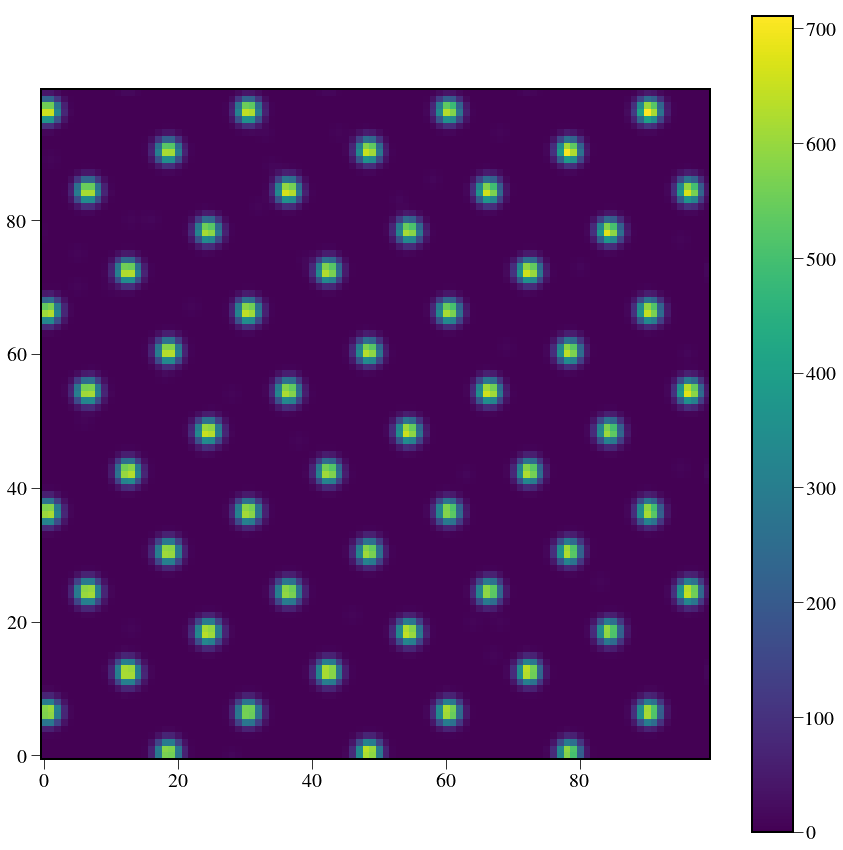

In [26]:
from scipy import signal
from crispy.tools.image import Image
from photutils import DAOStarFinder
from astropy.stats import sigma_clipped_stats
flux = 1000
bkgd = 10


noisy = np.random.poisson(flux*detectorFrame+bkgd)
mean, median, std = sigma_clipped_stats(noisy, sigma=3.0, iters=5)
print mean, median, std
plt.figure(figsize=(15,15))
plt.imshow(noisy[500:600,500:600]-median)
plt.colorbar()



ysize, xsize = noisy.shape
mask = (noisy-median>3*std)
order = 5
sig=1.

coef = None
allcoef = []

im = Image(data=(noisy-median)*mask)

x = np.arange(-1 * int(3 * sig + 1), int(3 * sig + 1) + 1)
x, y = np.meshgrid(x, x)
gaussian = np.exp(-(x**2 + y**2) / (2 * sig**2))
unfiltered = signal.convolve2d(
    im.data, gaussian, mode='same')
# unfiltered /= signal.convolve2d(im.ivar,
#                                 gaussian, mode='same') + 1e-10
plt.figure(figsize=(15,15))
plt.imshow(unfiltered[500:600,500:600])
plt.colorbar()


In [27]:
x, y, good, coef = locatePSFlets(im, polyorder=5, mask=mask, sig=sig, coef=coef, phi=par.philens, scale=par.pitch / par.pixsize, nlens=par.nlens)

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49903184183881, 512.49880258310645)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50834316048997, 512.5288623241446)


512.0 512.0


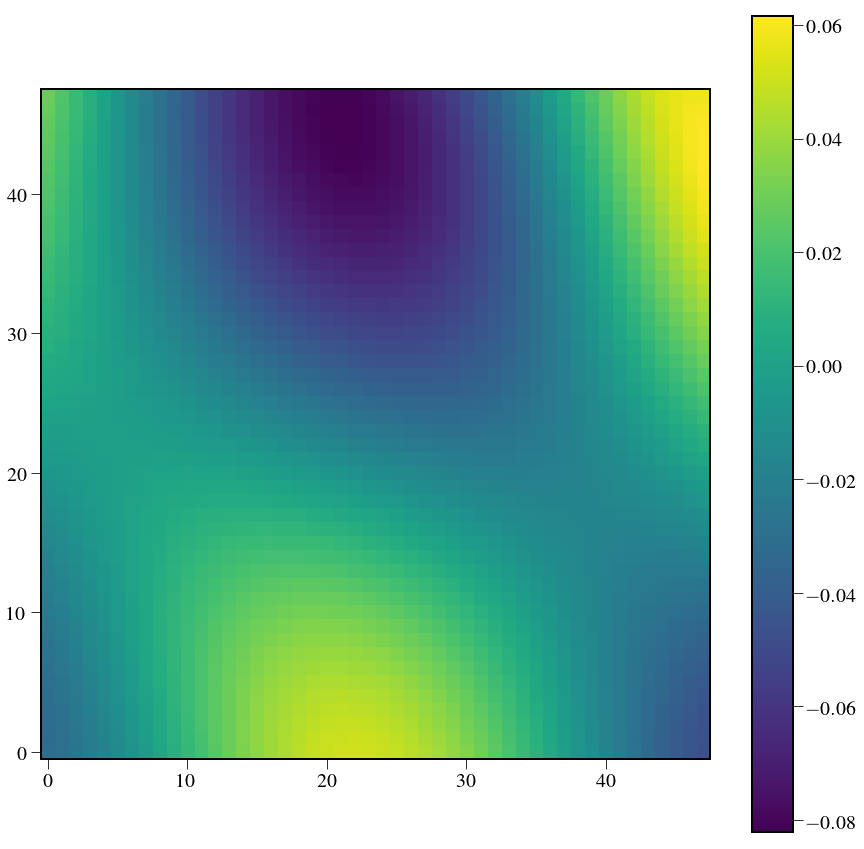

In [29]:
crop = 30
plt.figure(figsize=(15,15))
# img = np.sqrt((xcen.T-x+0.5)**2+(ycen.T-y+0.5)**2)
img = (xcen.T-x+0.5)
img = (ycen.T-y+0.5)
img = img[crop:-crop,crop:-crop]
plt.imshow(img)
plt.colorbar()
print xcen[54,54],ycen[54,54]

## Run entire grid

In [4]:
SNR = np.array([50])
flux = SNR**2
for i,f in enumerate(flux):
    noisy = np.random.poisson(f*detectorFrame)
    out = fits.HDUList(fits.PrimaryHDU(noisy.astype(np.float32)))
    out.writeto('/Users/mrizzo/Downloads/noisy%d.fits' % (SNR[i]),overwrite=True)
    ysize, xsize = noisy.shape
    mask = np.ones((ysize, xsize))
    order = 5

    coef = None
    allcoef = []

    im = Image(data=noisy)
    im.ivar = mask

    x, y, good, coef = locatePSFlets(im, polyorder=order, mask=mask, sig=2., coef=coef, phi=par.philens, scale=par.pitch / par.pixsize, nlens=par.nlens)
    out = fits.HDUList(fits.PrimaryHDU(x.astype(np.float32)))
    out.append(fits.PrimaryHDU(y.astype(np.float32)))
    out.writeto('/Users/mrizzo/Downloads/xy%d.fits' % (SNR[i]),overwrite=True)


crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50016979543761, 512.5008733980045)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.51524341504341, 512.52599691721059)


In [7]:
meandist = []
crop = 30
for i in range(len(SNR)):
    snr = SNR[i]
    fo = fits.open('/Users/mrizzo/Downloads/xy%d.fits' % (SNR[i]))
    x = fo[0].data
    y = fo[1].data
#     img = np.sqrt((xcen.T-x+0.5)**2+(ycen.T-y+0.5)**2)
    img = (xcen-x+0.5)
    img = img[crop:-crop,crop:-crop]
    print "SNR: {:}".format(snr)
    print "X: {:} +/- {:}, min/max: {:}/{:}".format(np.mean(img),np.std(img),np.amin(img),np.amax(img))
    img = (ycen-y+0.5)
    img = img[crop:-crop,crop:-crop]
    print "Y: {:} +/- {:}, min/max: {:}/{:}".format(np.mean(img),np.std(img),np.amin(img),np.amax(img))


SNR: 50
X: -0.00295552093976 +/- 0.03943755046, min/max: -0.0820394903232/0.0830017759035
Y: -0.00681809687859 +/- 0.0225448032233, min/max: -0.0454974451768/0.0528662184369


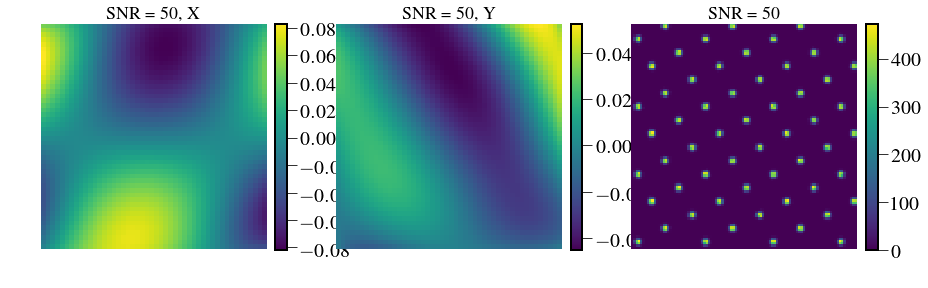

In [8]:
n = len(SNR)
for i in range(n):
    snr = SNR[i]
    fo = fits.open('/Users/mrizzo/Downloads/xy%d.fits' % (SNR[i]))
    so = fits.open('/Users/mrizzo/Downloads/noisy%d.fits' % (SNR[i]))
    x = fo[0].data
    y = fo[1].data
    plt.figure(figsize=(15,15))
    
    plt.subplot(131)
    plt.title("SNR = {:}, X".format(snr))
    img = (xcen-x+0.5)
    # img = (ycen.T-y+0.5)
    img = img[crop:-crop,crop:-crop]
    plt.imshow(img)
    plt.colorbar(fraction=0.046, pad=0.04)
    plt.axis('off')
    plt.subplot(132)
    plt.title("SNR = {:}, Y".format(snr))

    img = (ycen-y+0.5)
    img = img[crop:-crop,crop:-crop]
    plt.imshow(img)
    plt.axis('off')
    plt.colorbar(fraction=0.046, pad=0.04)
    plt.subplot(133)
    plt.title("SNR = {:}".format(snr))

    img = so[0].data[450:550,450:550]
    plt.imshow(img)
    plt.axis('off')
    plt.colorbar(fraction=0.046, pad=0.04)


## Run a single SNR for many trials

In [40]:
ntrials = 100
snr = 10
Xlist = []
Ylist = []
for i in range(ntrials):
    noisy = np.random.poisson(snr**2*detectorFrame)
    ysize, xsize = noisy.shape
    mask = np.ones((ysize, xsize))
    order = 5

    coef = None
    allcoef = []

    im = Image(data=noisy)
    im.ivar = mask

    x, y, good, coef = locatePSFlets(im, polyorder=order, mask=mask, sig=2., coef=coef, phi=par.philens, scale=par.pitch / par.pixsize, nlens=par.nlens)
    X = (xcen.T-x+0.5)
    Y = (ycen.T-y+0.5)
    Xlist.append(X)
    Ylist.append(Y)
    


crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

In [42]:
Xlistarr = np.array(Xlist)
Ylistarr = np.array(Ylist)
out = fits.HDUList(fits.PrimaryHDU(Xlistarr.astype(np.float32)))
out.append(fits.PrimaryHDU(Ylistarr.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/XY%d.fits' % (ntrials),overwrite=True)


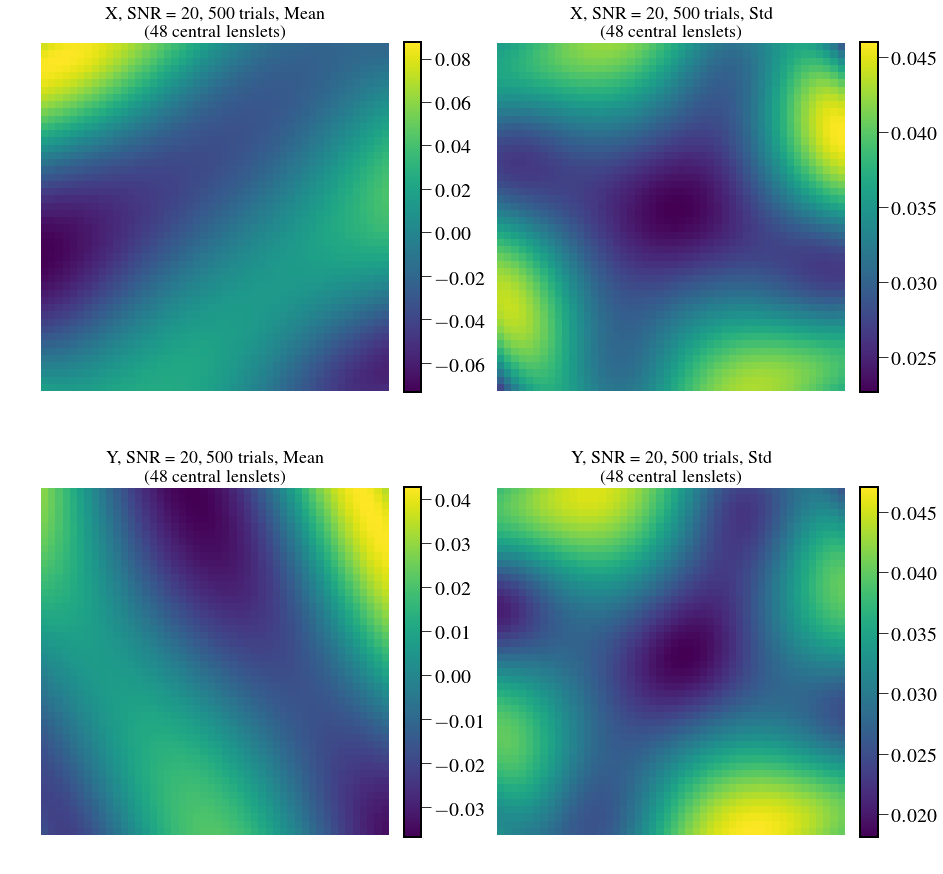

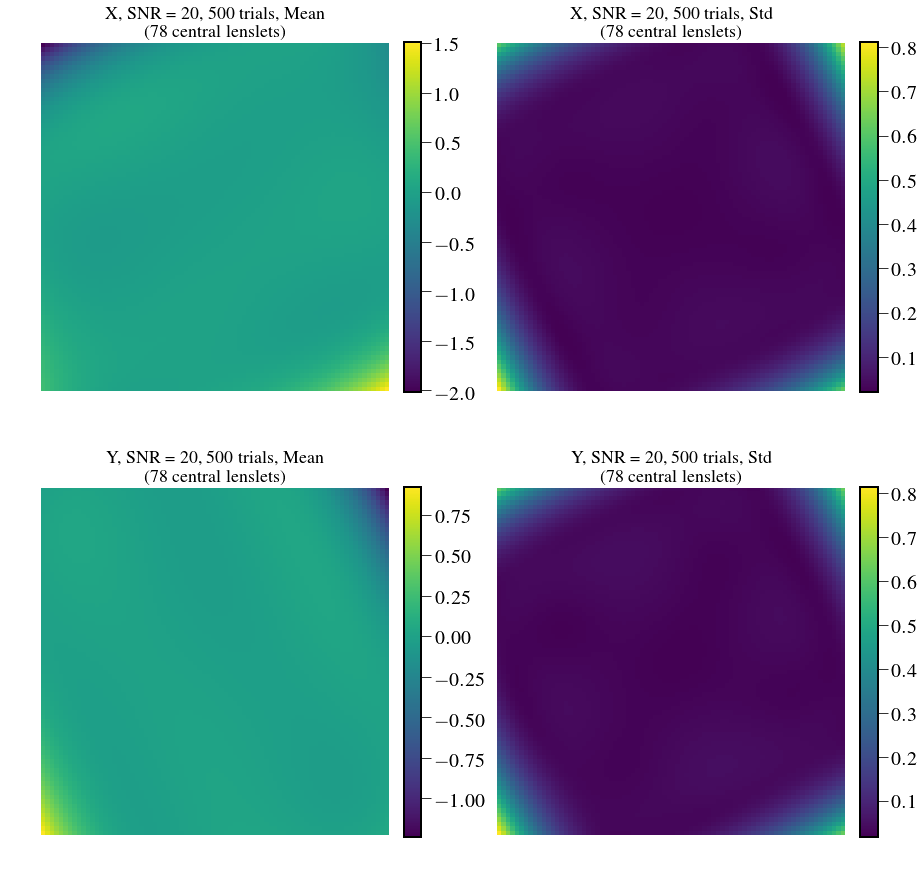

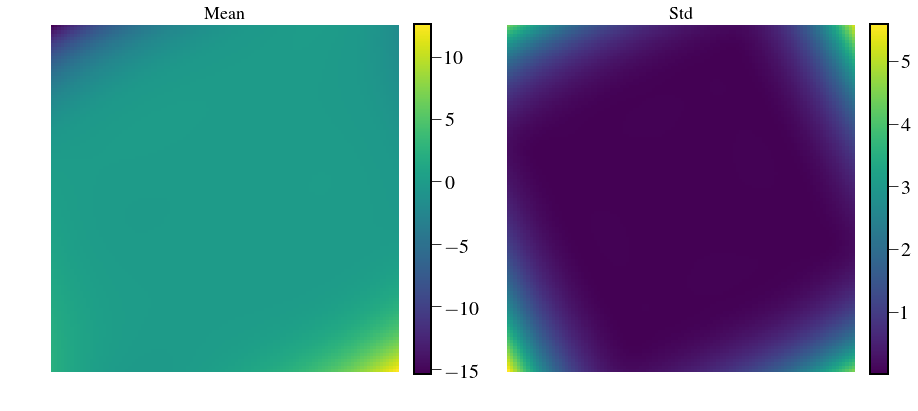

In [41]:
crop=30
plt.figure(figsize=(15,15))
plt.subplot(221)
plt.imshow(np.mean(Xlistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('X, SNR = %d, %d trials, Mean \n (%d central lenslets)'%(snr,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(222)
plt.imshow(np.std(Xlistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('X, SNR = %d, %d trials, Std \n (%d central lenslets)'%(snr,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(223)
plt.imshow(np.mean(Ylistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('Y, SNR = %d, %d trials, Mean \n (%d central lenslets)'%(snr,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(224)
plt.imshow(np.std(Ylistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('Y, SNR = %d, %d trials, Std \n (%d central lenslets)'%(snr,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)

crop=15
plt.figure(figsize=(15,15))
plt.subplot(221)
plt.imshow(np.mean(Xlistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('X, SNR = %d, %d trials, Mean \n (%d central lenslets)'%(snr,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(222)
plt.imshow(np.std(Xlistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('X, SNR = %d, %d trials, Std \n (%d central lenslets)'%(snr,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(223)
plt.imshow(np.mean(Ylistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('Y, SNR = %d, %d trials, Mean \n (%d central lenslets)'%(snr,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(224)
plt.imshow(np.std(Ylistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('Y, SNR = %d, %d trials, Std \n (%d central lenslets)'%(snr,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(np.mean(Xlistarr,axis=0))
plt.title('Mean')
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(122)
plt.imshow(np.std(Xlistarr,axis=0))
plt.title('Std ')
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)


In [ ]:
plt.figure(figsize=(15,15))
plt.hist(np.reshape(np.mean(Xlistarr,axis=0)[crop:-crop,crop:-crop],-1),bins=100)

## Run single SNR but for many trials and different psflet samplings

In [ ]:
from crispy.IFS import polychromeIFS,getQE
from crispy.tools.image import Image
from crispy.tools.locate_psflets import initcoef,transform,locatePSFlets
lam = 660.
inputCube = np.ones((1, 1024, 1024), dtype=float)
inCube = fits.HDUList(fits.PrimaryHDU(inputCube))
inCube[0].header['LAM_C'] = 0.66
inCube[0].header['PIXSIZE'] = 0.1
filelist = []

ntrials = 100
snr = 10

order=3
x0=0.32
xindx = np.arange(-108 / 2, 108 / 2)
xindx, yindx = np.meshgrid(xindx, xindx)

dispersion = 0.0
coef = initcoef(
    order,
    scale=par.pitch / par.pixsize,
    phi=-par.philens,
    x0=par.npix // 2 + x0,
    y0=par.npix // 2 + dispersion)
ycen, xcen = transform(xindx, yindx, order, coef)


FWHMlist = [1.8,1.9,2.0,2.1,2.5,3.0]
for fwhm in FWHMlist:
    par.FWHM=fwhm
    x0=x0
    dlam = 1./(getQE(par,lam)*(par.lenslet_sampling/inCube[0].header['PIXSIZE'])**2)  # this normalizes the image so that each lenslet has a volume of 1
    detectorFrame = polychromeIFS(
        par,
        [lam],
        inCube[0],
        dlambda=dlam,
        parallel=False,
        dx=x0)
    filename = '/Users/mrizzo/Downloads/det_%3d_fwhm=%.1f.fits' % (lam,par.FWHM)
    Image(data=detectorFrame, header=par.hdr).write(filename)
    

    
    Xlist = []
    Ylist = []
    for i in range(ntrials):
        noisy = np.random.poisson(snr**2*detectorFrame+1)
        ysize, xsize = noisy.shape
        mask = np.ones((ysize, xsize))
        order = 3

        coef = None
        allcoef = []

        im = Image(data=noisy)
        im.ivar = mask

        x, y, good, coef = locatePSFlets(im, polyorder=order, mask=mask, sig=2., coef=coef, phi=par.philens, scale=par.pitch / par.pixsize, nlens=par.nlens)
        X = (xcen.T-x+0.5)
        Y = (ycen.T-y+0.5)
        Xlist.append(X)
        Ylist.append(Y)
    Xlistarr = np.array(Xlist)
    Ylistarr = np.array(Ylist)
    out = fits.HDUList(fits.PrimaryHDU(Xlistarr.astype(np.float32)))
    out.append(fits.PrimaryHDU(Ylistarr.astype(np.float32)))
    out.writeto('/Users/mrizzo/Downloads/XY%d_fwhm=%.2f.fits' % (ntrials,par.FWHM),overwrite=True)



crispy - INFO - The number of input pixels per lenslet is 5.000000
crispy - INFO - Using PSFlet gaussian approximation
crispy - WARNING - Assuming slices are evenly spread in wavelengths
crispy - INFO - Creating Gaussian PSFLet templates
crispy - INFO - Writing data to ..//SimResults/detectorFramepoly.fits
crispy - INFO - Writing data to ..//SimResults/detectorFrame.fits
crispy - INFO - Done.
crispy - INFO - Performance: 6 seconds total
crispy - INFO - Writing data to /Users/mrizzo/Downloads/det_660_fwhm=1.8.fits
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49769226948683, 512.8269791759792)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49807514291274, 512.81895223907497)
crispy - INFO - Initializing PSFlet location transformati

crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50580504767754, 512.8138195114883)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50109853164065, 512.82187086973875)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50780780309901, 512.81874857406262)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.48637280528635, 512.82236032120477)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.4973625309

crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50883370910287, 512.81601225935606)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49198077763447, 512.81841160671706)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.52201239474061, 512.82024282413431)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50506280787863, 512.82136055911758)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.48632821493

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50919896653932, 512.82304080934671)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49799855671267, 512.80765986047072)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50725060334696, 512.82212606004396)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.48336777142447, 512.82218586803685)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transforma

crispy - INFO - Array origin: (512.49581511958922, 512.81810200939367)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49096771735742, 512.81829156159142)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50294975690713, 512.82009418612336)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49606262607574, 512.8129768403611)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49844273608289, 512.81487474093967)
crispy - INFO - Performing final optimization of PSFlet location transformation 

crispy - INFO - Array origin: (512.47161138834406, 512.82510172377386)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50277782006242, 512.82113075791426)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.5108984186528, 512.82221189344057)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50277049427234, 512.82236608781102)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.47450818185359, 512.8178065538566)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy -

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50408661146116, 512.82854163459547)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.51375498661105, 512.8128005256234)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.48874092808887, 512.81833712210812)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49611654044543, 512.82046530224909)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformat

crispy - INFO - Array origin: (512.49936139964723, 512.81327117788021)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.48579276737655, 512.79085173924977)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50496379891911, 512.81463284394567)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50368126639626, 512.83357633838443)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50047047117175, 512.83321178718893)
crispy - INFO - Performing final optimization of PSFlet location transformation

crispy - INFO - Array origin: (512.49196794763384, 512.82501619795437)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50092197125866, 512.82398269823443)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49274277369977, 512.82993609388973)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49889498061884, 512.81936696777598)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.47912249786611, 512.80653544502434)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy

crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50299663470287, 512.81918534028409)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49211401195203, 512.81415504941219)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.5021008480179, 512.82106733773446)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49704792386933, 512.81868647312911)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.5010321668

crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50031357184787, 512.82674812260075)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50174183423974, 512.82326816030309)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49107821174027, 512.81126085923768)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50145734308376, 512.81741422712298)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49377991976

crispy - INFO - Array origin: (512.49575210945352, 512.82152716758446)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50458206264648, 512.82678894264768)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50140533743979, 512.8274511679391)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50831060766154, 512.82295715080204)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.516388563139, 512.81925879749645)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - 

crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50143564556379, 512.81135073525593)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.4920021617786, 512.81091515000526)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.51224986810325, 512.82585111215303)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.52166244492662, 512.82566088968849)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.5025088466

crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.51522757312023, 512.82643737139722)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49006149052002, 512.815851477161)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.4694599846606, 512.80329328521759)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49698677470462, 512.81555987547904)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49122558310751

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50677786252629, 512.81494843820235)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50237175529526, 512.82829358748972)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50212190542834, 512.82078759841352)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49907325862091, 512.81338706281895)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transforma

crispy - INFO - Array origin: (512.50586671163614, 512.8142932667422)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49764519256473, 512.80851606896783)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50402921951218, 512.81908791718774)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49409114959667, 512.82924424602265)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50208856183792, 512.82484673202737)
crispy - INFO - Performing final optimization of PSFlet location transformation 

crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.48398768827633, 512.82237290337969)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50540778674781, 512.81766392930365)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.5163137068804, 512.82835319981075)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50017426050783, 512.8209175571601)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.4913174487851

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.51116361287757, 512.82110660187072)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.5029469196146, 512.8119570443813)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49305789734274, 512.82549321891622)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49184893245251, 512.82401407222312)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformati

crispy - INFO - Array origin: (512.50538362177747, 512.82362942616965)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.51349398575314, 512.82174451163746)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49246891356802, 512.82761826438843)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.48118709234689, 512.8236502747427)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49786131058534, 512.8231549449423)
crispy - INFO - Performing final optimization of PSFlet location transformation c

crispy - INFO - Array origin: (512.50249005936394, 512.81207405888279)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50740502931046, 512.82285712832709)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50787321065582, 512.81671586442587)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49716366827101, 512.80932975474047)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50109894314187, 512.80744112495051)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy

crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50754961629718, 512.82065934645107)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49075241161086, 512.8343279265107)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50807326494453, 512.82290533820117)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49299924349566, 512.82618004896653)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.5060071846

crispy - INFO - Array origin: (512.49578169554707, 512.8220437036108)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50853271645076, 512.81106480741096)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.4974190513467, 512.8198266225312)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50739754176652, 512.82223409048754)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49496286551653, 512.82476198565007)
crispy - INFO - Performing final optimization of PSFlet location transformation co

crispy - INFO - Array origin: (512.50071283098487, 512.81590993328075)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50728524314093, 512.81985824685887)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.51493384662149, 512.84134914063225)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50450446644038, 512.8174818690627)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.47840894110755, 512.82081409749264)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy 

crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.4939181086678, 512.81639257914253)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.51679590905712, 512.83880028184217)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50492443064718, 512.81898726311294)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.48241930177039, 512.82626690769087)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.5169691509

crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50405489018806, 512.82712868637179)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.4962018572021, 512.81753958570062)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.51527129530211, 512.82747904883263)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50530080685417, 512.82229996368812)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.506657875837

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50666077789151, 512.82789172277603)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49633639274577, 512.81363558174849)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50618056825374, 512.82861787727757)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50736476850216, 512.83393243298701)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transforma

crispy - INFO - Array origin: (512.4957193872325, 512.83425557817702)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49848664766216, 512.85347684372368)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50287755211309, 512.81183086544843)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.47730477849893, 512.80042437693385)
crispy - INFO - The number of input pixels per lenslet is 5.000000
crispy - INFO - Using PSFlet gaussian approximation
crispy - WARNING - Assuming slices are evenly spread in wavelengths
crispy - INFO - Creating Gaussian PSFLet templates
crispy - INFO - Writing data to ..//SimResults/detectorFramepoly.fits
crispy - INFO - Writin

crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.47413617726056, 512.82836132374325)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49895138353133, 512.82321100636705)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49210317724339, 512.81632617175944)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49586687217709, 512.82581780296096)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50194156221

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49997300404175, 512.83281820741433)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.480475385163, 512.83902016230854)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.51924977404406, 512.82278804513476)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49007515905657, 512.83519932608192)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformati

crispy - INFO - Array origin: (512.49761899700388, 512.82842444802816)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.51510663281272, 512.830200985175)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49360629740647, 512.81890340329323)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.47266554839007, 512.81826167403142)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.48389578219155, 512.82547127415228)
crispy - INFO - Performing final optimization of PSFlet location transformation c

crispy - INFO - Array origin: (512.48130455941339, 512.82386732916939)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49601488203075, 512.81692269249015)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.48248805879871, 512.81880534690845)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50490443177284, 512.8170677929412)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.51230770808968, 512.84304309280253)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy 

crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50766235095409, 512.81835724016935)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50882183419776, 512.83697922083275)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.51071587155479, 512.83128442552902)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.51921380774195, 512.83707216876621)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.501392280

In [11]:
f = 1.8
XY = fits.open('/Users/mrizzo/Downloads/XY100_fwhm=%.2f.fits' % f)
Xlistarr = XY[0].data
Ylistarr = XY[1].data

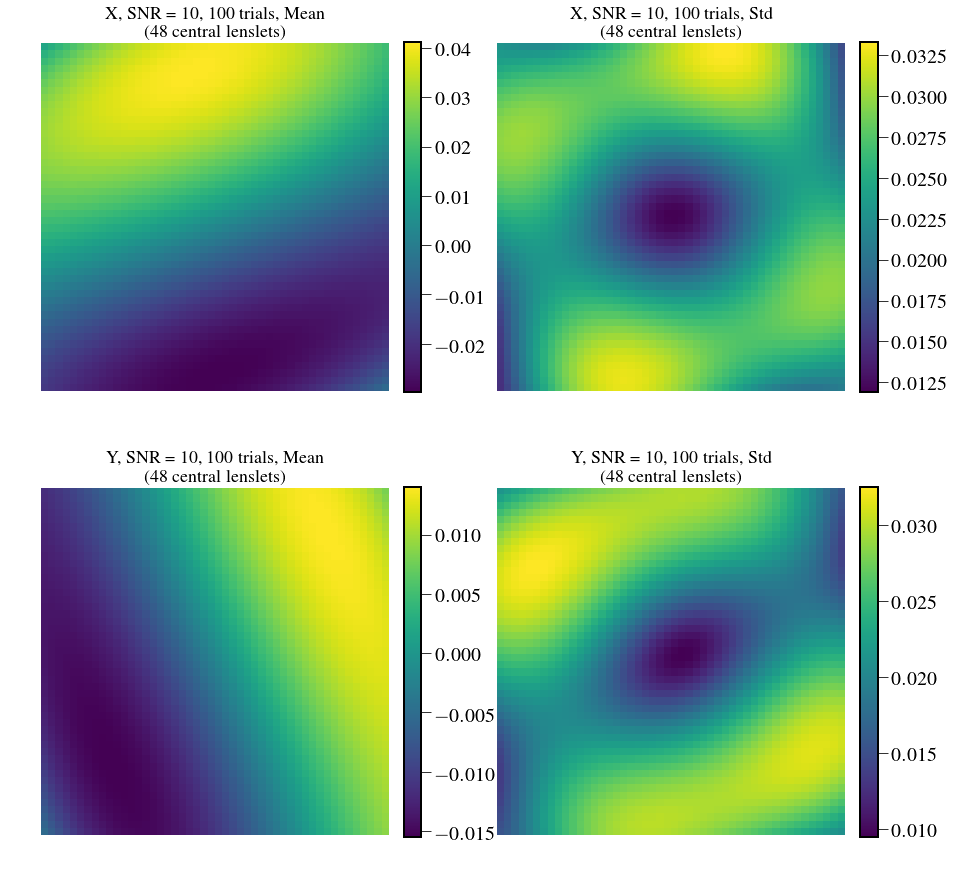

In [12]:

crop=30
plt.figure(figsize=(15,15))
plt.subplot(221)
plt.imshow(np.mean(Xlistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('X, SNR = %d, %d trials, Mean \n (%d central lenslets)'%(snr,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(222)
plt.imshow(np.std(Xlistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('X, SNR = %d, %d trials, Std \n (%d central lenslets)'%(snr,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(223)
plt.imshow(np.mean(Ylistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('Y, SNR = %d, %d trials, Mean \n (%d central lenslets)'%(snr,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(224)
plt.imshow(np.std(Ylistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('Y, SNR = %d, %d trials, Std \n (%d central lenslets)'%(snr,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)

## Repeat parameter search but now create a higher-order polynomial

### Test polynomial function

In [24]:
xindx = np.arange(-108 / 2, 108 / 2)
xindx, yindx = np.meshgrid(xindx, xindx)
X = np.reshape(xindx,-1)
Y = np.reshape(yindx,-1)
# A = np.array([np.ones_like(X), X, Y, X**2, X**2*Y, X**2*Y**2, Y**2, X*Y**2, X*Y]).T
A = np.array([np.ones_like(X), X, Y]).T

x0=0.32
spacing = 174./13.
interlace=2
phi = -np.arcsin(1./np.sqrt(interlace**2+1))
coeffx = np.array([512,spacing*np.cos(phi),spacing*np.sin(phi)])
coeffy = np.array([512+x0,-spacing*np.sin(phi),spacing*np.cos(phi)])
coef = initcoef(
    order,
    scale=par.pitch / par.pixsize,
    phi=-par.philens,
    x0=par.npix // 2 + x0,
    y0=par.npix // 2 + dispersion)
print coef
ycen, xcen = transform(xindx, yindx, order, coef)
xcen2 = np.reshape(np.dot(A,coeffx),xindx.shape)
ycen2 = np.reshape(np.dot(A,coeffy),yindx.shape)
print ycen-ycen2

[512.32000000000005, 11.971563941075797, 0.0, 0.0, 5.9857819705378983, 0.0, 0.0, 0.0, 0.0, 0.0, 512.0, -5.9857819705378983, 0.0, 0.0, 11.971563941075797, 0.0, 0.0, 0.0, 0.0, 0.0]
[[  0.00000000e+00   0.00000000e+00   0.00000000e+00 ...,  -2.84217094e-14
   -8.52651283e-14  -8.52651283e-14]
 [  0.00000000e+00   0.00000000e+00   5.68434189e-14 ...,   0.00000000e+00
   -5.68434189e-14  -5.68434189e-14]
 [  5.68434189e-14   5.68434189e-14   5.68434189e-14 ...,   5.68434189e-14
    0.00000000e+00   0.00000000e+00]
 ..., 
 [  2.27373675e-13   1.13686838e-13   2.27373675e-13 ...,   2.27373675e-13
    0.00000000e+00   2.27373675e-13]
 [  0.00000000e+00  -1.13686838e-13   0.00000000e+00 ...,   0.00000000e+00
   -2.27373675e-13   0.00000000e+00]
 [  0.00000000e+00  -1.13686838e-13   1.13686838e-13 ...,   0.00000000e+00
   -2.27373675e-13   0.00000000e+00]]


### Test create image

In [63]:
from crispy.tools.imgtools import gausspsf
y = np.reshape(np.dot(A,coeffy),yindx.shape)
x = np.reshape(np.dot(A,coeffx),xindx.shape)
gsize = 20
lx = 1024+2*gsize
img = np.zeros((lx,lx))
fwhm = 2.
sig = fwhm/2.35
# gaussmap = np.sum(np.exp(-d**2/2./sig**2),axis=0)
print y[108 / 2, 108 / 2]
print x[108 / 2, 108 / 2]
ry = np.reshape(y,-1)
rx = np.reshape(x,-1)
print lx
for i in range(len(ry)):
    yi = ry[i]+gsize
    xi = rx[i]+gsize
    xmin = int(xi)-gsize
    xmax = xmin+2*gsize
    ymin = int(yi)-gsize
    ymax = ymin+2*gsize
#     if yi>gsize and yi<1024-gsize and xi>gsize and xi<1024-gsize:
    if ymin>0 and xmin>0 and xmax<lx and ymax<lx:
#         dx = np.arange(-gsize,gsize)
#         dx,dy = np.meshgrid(dx,dx)
#         d2 = (dx-(xi-xmin))**2+(dy-(yi-ymin))**2
#         img[ymin:ymax,xmin:xmax]+=np.exp(-d2/2./sig**2)/np.sqrt(2*np.pi*sig**2)
        dx = xi - int(xi)
        dy = yi - int(yi)
        img[ymin:ymax,xmin:xmax]+=gausspsf(size=2*gsize,fwhm=fwhm,offx=dx,offy=dy)

    

512.32
512.0
1064


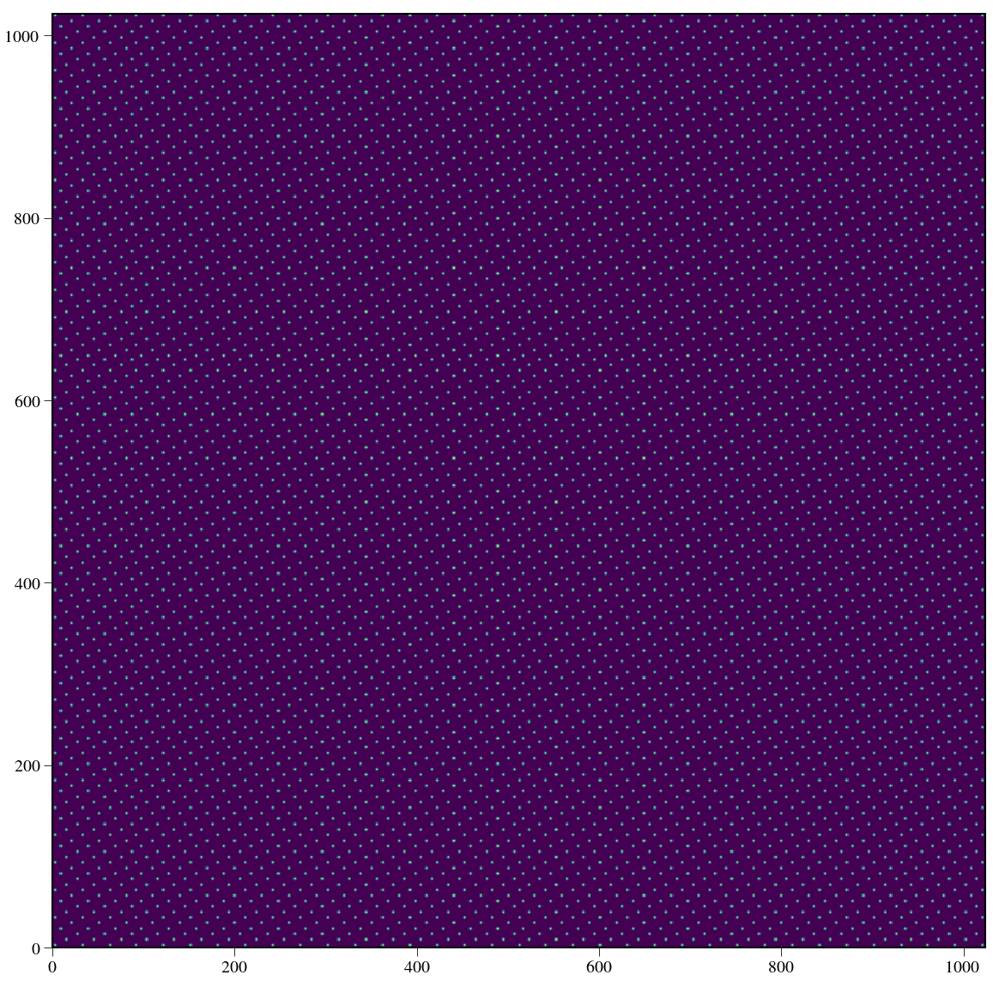

In [64]:
plt.figure(figsize=(20,20))
plt.imshow(img[gsize:-gsize,gsize:-gsize])
out = fits.HDUList(fits.PrimaryHDU(img[gsize:-gsize,gsize:-gsize].astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/img.fits',overwrite=True)


### Now add distortion

512.32
512.0
1064


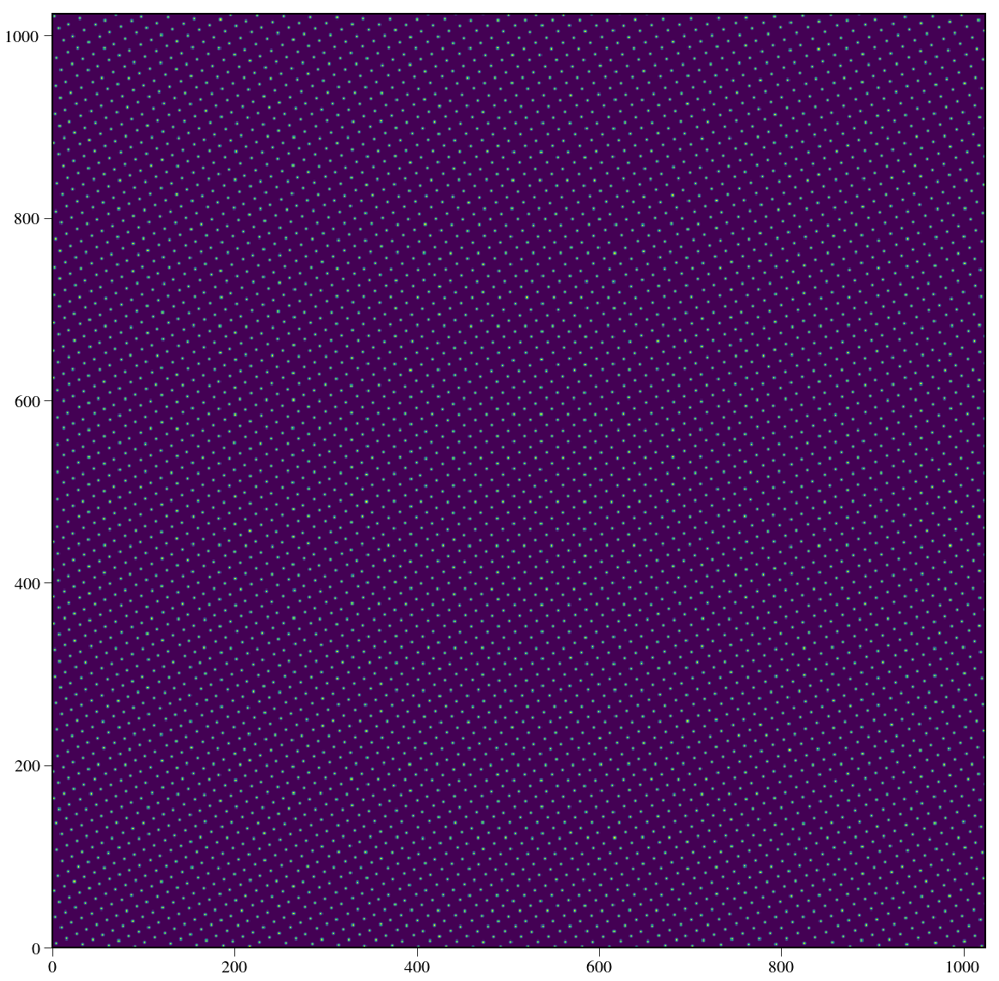

In [71]:
xindx = np.arange(-108 / 2, 108 / 2)
xindx, yindx = np.meshgrid(xindx, xindx)
X = np.reshape(xindx,-1)
Y = np.reshape(yindx,-1)
# A = np.array([np.ones_like(X), X, Y, X**2, X**2*Y, X**2*Y**2, Y**2, X*Y**2, X*Y]).T
A = np.array([np.ones_like(X), X, Y, X**2, Y**2, X*Y, X**2*Y, X*Y**2]).T

x0=0.32
spacing = 174./13.
interlace=2
phi = -np.arcsin(1./np.sqrt(interlace**2+1))
coeffx = np.array([512,spacing*np.cos(phi),spacing*np.sin(phi),0.01,0.01,0.00,0.0,0.0])
coeffy = np.array([512+x0,-spacing*np.sin(phi),spacing*np.cos(phi),0.01,0.01,0.00,0.0,0.0])

y = np.reshape(np.dot(A,coeffy),yindx.shape)
x = np.reshape(np.dot(A,coeffx),xindx.shape)
gsize = 20
lx = 1024+2*gsize
img = np.zeros((lx,lx))
fwhm = 2.
sig = fwhm/2.35
# gaussmap = np.sum(np.exp(-d**2/2./sig**2),axis=0)
print y[108 / 2, 108 / 2]
print x[108 / 2, 108 / 2]
ry = np.reshape(y,-1)
rx = np.reshape(x,-1)
print lx
for i in range(len(ry)):
    yi = ry[i]+gsize
    xi = rx[i]+gsize
    xmin = int(xi)-gsize
    xmax = xmin+2*gsize
    ymin = int(yi)-gsize
    ymax = ymin+2*gsize
#     if yi>gsize and yi<1024-gsize and xi>gsize and xi<1024-gsize:
    if ymin>0 and xmin>0 and xmax<lx and ymax<lx:
#         dx = np.arange(-gsize,gsize)
#         dx,dy = np.meshgrid(dx,dx)
#         d2 = (dx-(xi-xmin))**2+(dy-(yi-ymin))**2
#         img[ymin:ymax,xmin:xmax]+=np.exp(-d2/2./sig**2)/np.sqrt(2*np.pi*sig**2)
        dx = xi - int(xi)
        dy = yi - int(yi)
        img[ymin:ymax,xmin:xmax]+=gausspsf(size=2*gsize,fwhm=fwhm,offx=dx,offy=dy)

plt.figure(figsize=(20,20))
plt.imshow(img[gsize:-gsize,gsize:-gsize])
out = fits.HDUList(fits.PrimaryHDU(img[gsize:-gsize,gsize:-gsize].astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/imgdist.fits',overwrite=True)


### Run loop

In [6]:
from crispy.IFS import polychromeIFS,getQE
from crispy.tools.image import Image
from crispy.tools.locate_psflets import initcoef,transform,locatePSFlets
from crispy.tools.imgtools import gausspsf
from astropy.stats import sigma_clipped_stats

lam = 660.

ntrials = 10
snr = 10


FWHMlist = [2.0]
for fwhm in FWHMlist:
    par.FWHM=fwhm
    xindx = np.arange(-108 / 2, 108 / 2)
    xindx, yindx = np.meshgrid(xindx, xindx)
    X = np.reshape(xindx,-1)
    Y = np.reshape(yindx,-1)
    # A = np.array([np.ones_like(X), X, Y, X**2, X**2*Y, X**2*Y**2, Y**2, X*Y**2, X*Y]).T
    A = np.array([np.ones_like(X), X, Y, X**2, Y**2, X*Y, X**2*Y, X*Y**2]).T

    x0=0.32
    spacing = 174./13.
    interlace=2
    phi = -np.arcsin(1./np.sqrt(interlace**2+1))
    coeffx = np.array([512,spacing*np.cos(phi),spacing*np.sin(phi),0.01,0.01,0.0,0.001,0.0])
    coeffy = np.array([512+x0,-spacing*np.sin(phi),spacing*np.cos(phi),0.01,0.01,0.0,0.001,0.0])

    ycen = np.reshape(np.dot(A,coeffy),yindx.shape)
    xcen = np.reshape(np.dot(A,coeffx),xindx.shape)
    gsize = 20
    lx = 1024+2*gsize
    detectorFrame = np.zeros((lx,lx))
    print ycen[108 / 2, 108 / 2]
    print xcen[108 / 2, 108 / 2]
    ry = np.reshape(ycen,-1)
    rx = np.reshape(xcen,-1)
    print lx
    for i in range(len(ry)):
        yi = ry[i]+gsize
        xi = rx[i]+gsize
        xmin = int(xi)-gsize
        xmax = xmin+2*gsize
        ymin = int(yi)-gsize
        ymax = ymin+2*gsize
        if ymin>0 and xmin>0 and xmax<lx and ymax<lx:
            dx = xi - int(xi)
            dy = yi - int(yi)
            detectorFrame[ymin:ymax,xmin:xmax]+=gausspsf(size=2*gsize,fwhm=fwhm,offx=dx,offy=dy)
    
    detectorFrame = detectorFrame[gsize:-gsize,gsize:-gsize]

    
    Xlist = []
    Ylist = []
    for i in range(ntrials):
        noisy = np.random.poisson(snr**2*detectorFrame+1)
        mean, median, std = sigma_clipped_stats(noisy, sigma=3.0, iters=5)
        print "Mean, median, std: {:}".format((mean,median,std))
        ysize, xsize = noisy.shape
        mask = (noisy-median>3*std)
        order = 3

        coef = None
        allcoef = []

        im = Image(data=noisy)
        im.ivar = mask

        x, y, good, coef = locatePSFlets(im, polyorder=order, mask=mask, sig=1., 
                                         coef=coef, phi=par.philens, scale=par.pitch / par.pixsize, 
                                         nlens=par.nlens,trimfrac=0.0)
        X = (xcen.T-x-1)
        Y = (ycen.T-y-1)
        Xlist.append(X)
        Ylist.append(Y)
    Xlistarr = np.array(Xlist)
    Ylistarr = np.array(Ylist)
    out = fits.HDUList(fits.PrimaryHDU(Xlistarr.astype(np.float32)))
    out.append(fits.PrimaryHDU(Ylistarr.astype(np.float32)))
    out.writeto('/Users/mrizzo/Downloads/XY%d_fwhm=%.2f_dist.fits' % (ntrials,par.FWHM),overwrite=True)



512.32
512.0
1064
Mean, median, std: (1.0635019023861718, 1.0, 1.0273769398627532)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (511.30226066443089, 511.30078629549018)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (511.04034815619832, 511.31409843963297)
Mean, median, std: (1.0638388768371851, 1.0, 1.0290139729675944)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (511.34221152136899, 511.31171905229291)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (511.02563517553176, 511.28861052644658)
Me

In [7]:
print coef

[  5.11534462e+02   1.19769042e+01   9.57462505e-03  -4.28837994e-06
  -5.98237046e+00  -5.85303356e-05   9.98753288e-04   9.60161657e-03
  -6.22450485e-06  -3.44843946e-06   5.11335044e+02   5.97296636e+00
   1.00329194e-02   1.04978279e-05   1.19785881e+01  -5.68112424e-05
   9.86601216e-04   9.97780332e-03   2.66479869e-06  -3.64015350e-06]


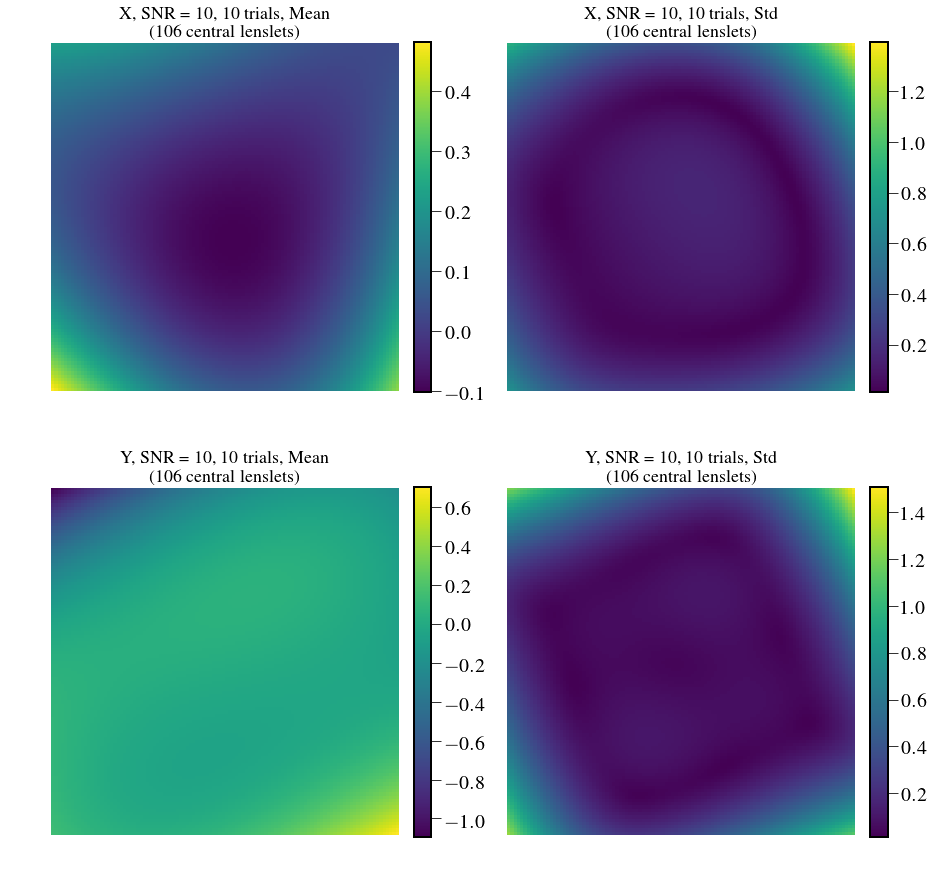

In [9]:
f = 2.0
XY = fits.open('/Users/mrizzo/Downloads/XY10_fwhm=%.2f_dist.fits' % f)
Xlistarr = XY[0].data[:,:,:]
Ylistarr = XY[1].data[:,:,:]

crop=1
plt.figure(figsize=(15,15))
plt.subplot(221)
plt.imshow(np.mean(Xlistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('X, SNR = %d, %d trials, Mean \n (%d central lenslets)'%(snr,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(222)
plt.imshow(np.std(Xlistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('X, SNR = %d, %d trials, Std \n (%d central lenslets)'%(snr,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(223)
plt.imshow(np.mean(Ylistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('Y, SNR = %d, %d trials, Mean \n (%d central lenslets)'%(snr,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(224)
plt.imshow(np.std(Ylistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('Y, SNR = %d, %d trials, Std \n (%d central lenslets)'%(snr,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)

## Attempt understanding more details about Tim's wavelength calibration

In [6]:
order = 3
i = 0
print "X"
for ix in range(order + 1):
    for iy in range(order - ix + 1):
        print "x, y", ix,iy
        i += 1
print "Y"
for ix in range(order + 1):
    for iy in range(order - ix + 1):
        print "x, y", ix,iy
        i += 1


X
x, y 0 0
x, y 0 1
x, y 0 2
x, y 0 3
x, y 1 0
x, y 1 1
x, y 1 2
x, y 2 0
x, y 2 1
x, y 3 0
Y
x, y 0 0
x, y 0 1
x, y 0 2
x, y 0 3
x, y 1 0
x, y 1 1
x, y 1 2
x, y 2 0
x, y 2 1
x, y 3 0


In [2]:
Xlist = []
Ylist = []
order = 3
xindx = np.arange(-108 / 2, 108 / 2)
xindx, yindx = np.meshgrid(xindx, xindx)
i = 0
for ix in range(order + 1):
    for iy in range(order - ix + 1):
        Xlist.append(xindx**ix * yindx**iy)
        Ylist.append(xindx**ix * yindx**iy)

Xlist = np.array(Xlist)
Ylist = np.array(Ylist)
print Xlist.shape

(10, 108, 108)


In [3]:
Xcoefs = np.array([512,12,0.01,0.,-6,0.0,0.0,0.01,0.0,0.0])
Ycoefs = np.array([512,6,0.01,0.,12,0.0,0.0,0.01,0.0,0.0])

# X = np.sum(Xlist*Xcoefs[:,np.newaxis,np.newaxis],axis=0)
# Y = np.sum(Ylist*Ycoefs[:,np.newaxis,np.newaxis],axis=0)
X = np.dot(Xlist.T,Xcoefs)
Y = np.dot(Ylist.T,Ycoefs)
print X,Y
print X.shape
xdim,ydim=1024,1024
good = (X > 5) * (X < xdim - 5) * (Y > 5) * (Y < ydim - 5)

[[  246.32   257.25   268.2  ...,  1503.17  1516.2   1529.25]
 [  239.25   250.18   261.13 ...,  1496.1   1509.13  1522.18]
 [  232.2    243.13   254.08 ...,  1489.05  1502.08  1515.13]
 ..., 
 [ -386.83  -375.9   -364.95 ...,   870.02   883.05   896.1 ]
 [ -391.8   -380.87  -369.92 ...,   865.05   878.08   891.13]
 [ -396.75  -385.82  -374.87 ...,   860.1    873.13   886.18]] [[ -401.68  -396.75  -391.8  ...,   225.17   232.2    239.25]
 [ -390.75  -385.82  -380.87 ...,   236.1    243.13   250.18]
 [ -379.8   -374.87  -369.92 ...,   247.05   254.08   261.13]
 ..., 
 [  855.17   860.1    865.05 ...,  1482.02  1489.05  1496.1 ]
 [  868.2    873.13   878.08 ...,  1495.05  1502.08  1509.13]
 [  881.25   886.18   891.13 ...,  1508.1   1515.13  1522.18]]
(108, 108)


In [4]:
from crispy.tools.imgtools import gausspsf
fwhm=2.0
gsize = 5
lx = 1024+2*gsize
detectorFrame = np.zeros((lx,lx))
# print Y[108 / 2, 108 / 2]
# print X[108 / 2, 108 / 2]
ry = np.reshape(Y,-1)
rx = np.reshape(X,-1)
rgood = np.reshape(good,-1)
# print lx
for i in range(len(ry)):
    if rgood[i]:
        yi = ry[i]+gsize
        xi = rx[i]+gsize
        xmin = int(xi)-gsize
        xmax = xmin+2*gsize
        ymin = int(yi)-gsize
        ymax = ymin+2*gsize
        if ymin>0 and xmin>0 and xmax<lx and ymax<lx:
            dx = xi - int(xi)
            dy = yi - int(yi)
            detectorFrame[ymin:ymax,xmin:xmax]+=gausspsf(size=2*gsize,fwhm=fwhm,offx=dx,offy=dy)

detectorFrame = detectorFrame[gsize:-gsize,gsize:-gsize]


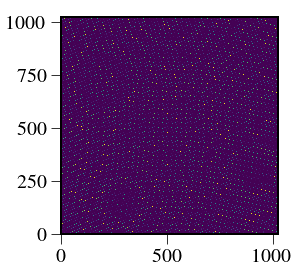

In [5]:
plt.imshow(detectorFrame)

### New transform function

In [39]:
def new_transform(x, y, order, coef):
    Xlist = []
    Ylist = []
    i = 0
    for ix in range(order + 1):
        for iy in range(order - ix + 1):
            Xlist.append(xindx**ix * yindx**iy)
            Ylist.append(xindx**ix * yindx**iy)

    Xlist = np.array(Xlist)
    Ylist = np.array(Ylist)
    ncoefs = (order + 1) * (order + 2) // 2
    Xcoefs = coef[:ncoefs]
    Ycoefs = coef[-ncoefs:]
    X = np.dot(Xlist.T,Xcoefs)
    Y = np.dot(Ylist.T,Ycoefs)
    return X,Y

In [53]:
newcoefs = np.concatenate([Xcoefs,Ycoefs])
print newcoefs

[  5.12000000e+02   1.20000000e+01   1.00000000e-02   0.00000000e+00
  -6.00000000e+00   0.00000000e+00   0.00000000e+00   1.00000000e-02
   0.00000000e+00   0.00000000e+00   5.12000000e+02   6.00000000e+00
   1.00000000e-02   0.00000000e+00   1.20000000e+01   0.00000000e+00
   0.00000000e+00   1.00000000e-02   0.00000000e+00   0.00000000e+00]


### Check new transform function

In [54]:
Xc,Yc = new_transform(xindx,yindx,3,newcoefs)

gsize = 5
lx = 1024+2*gsize
detectorFrame = np.zeros((lx,lx))
print Yc[108 / 2, 108 / 2]
print Xc[108 / 2, 108 / 2]
ry = np.reshape(Yc,-1)
rx = np.reshape(Xc,-1)
# print lx
for i in range(len(ry)):
        yi = ry[i]+gsize
        xi = rx[i]+gsize
        xmin = int(xi)-gsize
        xmax = xmin+2*gsize
        ymin = int(yi)-gsize
        ymax = ymin+2*gsize
        if ymin>0 and xmin>0 and xmax<lx and ymax<lx:
            dx = xi - int(xi)
            dy = yi - int(yi)
            detectorFrame[ymin:ymax,xmin:xmax]+=gausspsf(size=2*gsize,fwhm=fwhm,offx=dx,offy=dy)

detectorFrame = detectorFrame[gsize:-gsize,gsize:-gsize]


512.0
512.0
[[ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 ..., 
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]
 [ 0.  0.  0. ...,  0.  0.  0.]]


### New score function for optimization

In [81]:
def simplepsf(size=20,fwhm=2.,offx=0.0,offy=0.0):

    _x = np.arange(size) - size // 2 + offx
    _y = np.arange(size) - size // 2 + offy
    _x, _y = np.meshgrid(_x, _y)
    sigma = fwhm / 2.35
    psflet = np.exp(-(_x**2+_y**2)/2./sigma**2)
#     psflet = (erf((_x + 0.5) / (np.sqrt(2) * sigma)) -
#               erf((_x - 0.5) / (np.sqrt(2) * sigma))) * \
#         (erf((_y + 0.5) / (np.sqrt(2) * sigma)) -
#          erf((_y - 0.5) / (np.sqrt(2) * sigma)))
#     psflet /= np.sum(psflet)
    return psflet


lx=1024
def corrval(coef, x, y, filtered, order, trimfrac=0.1,gsize=2):
    _x, _y = new_transform(x, y, order, coef)
    s = 0.0
    ry = np.reshape(_y,-1)
    rx = np.reshape(_x,-1)
    for i in range(len(ry)):
        yi = ry[i]
        xi = rx[i]
        xmin = int(xi)-gsize
        xmax = xmin+2*gsize
        ymin = int(yi)-gsize
        ymax = ymin+2*gsize
        if ymin>2*gsize and xmin>2*gsize and xmax<lx-2*gsize and ymax<lx-2*gsize:
            dx = xi - int(xi)
            dy = yi - int(yi)
#             s+=np.sum(simplepsf(size=2*gsize,fwhm=fwhm,offx=dx,offy=dy)*filtered[ymin:ymax,xmin:xmax])
#             s+=np.sum(gausspsf(size=2*gsize,fwhm=fwhm,offx=dx,offy=dy)*filtered[ymin:ymax,xmin:xmax])
            s+=np.sum(filtered[ymin:ymax,xmin:xmax])
    return -s


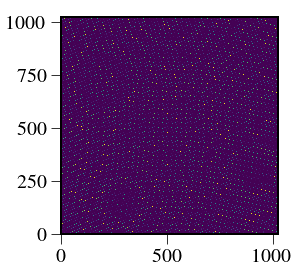

In [8]:
snr=50
det = np.random.poisson(snr**2*detectorFrame+1)
plt.imshow(detectorFrame)

In [86]:
xindx = np.arange(-108 / 2, 108 / 2)
xindx, yindx = np.meshgrid(xindx, xindx)
print corrval(coef,xindx,yindx,det,3,trimfrac=0.0)

-9368617.0


### Test optimization function

In [5]:
from crispy.tools.locate_psflets import initcoef,transform,locatePSFlets
from crispy.tools.image import Image
ntrials=10
snr=50
for i in range(ntrials):
    noisy = np.random.poisson(snr**2*detectorFrame+1)
    ysize, xsize = noisy.shape
    mask = np.ones((ysize, xsize))
    order = 3

    coef = None
    allcoef = []

    im = Image(data=noisy)
    im.ivar = mask

    x, y, good, coef = locatePSFlets(im, polyorder=order, mask=mask, sig=2., 
                                     coef=coef, phi=par.philens, scale=par.pitch / par.pixsize, 
                                     nlens=par.nlens,trimfrac=0.0)
    X = (xcen.T-x-1)
    Y = (ycen.T-y-1)
    Xlist.append(X)
    Ylist.append(Y)
Xlistarr = np.array(Xlist)
Ylistarr = np.array(Ylist)
out = fits.HDUList(fits.PrimaryHDU(Xlistarr.astype(np.float32)))
out.append(fits.PrimaryHDU(Ylistarr.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/XY%d_fwhm=%.2f_dist_newcal.fits' % (ntrials,fwhm),overwrite=True)


crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (513.4041100675903, 513.41498888342562)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.31137806134325, 512.27892677453929)


NameError: name 'xcen' is not defined

[  5.12311378e+02   1.20067454e+01   4.29612020e-03  -5.99336943e-03
  -6.04652900e+00   2.26456201e-04   2.64674834e-04   2.52974784e-03
  -1.13170992e-05   2.00865175e-03   5.12278927e+02   5.96353073e+00
   1.01987633e-03  -6.22249702e-06   1.20201798e+01   1.09760770e-05
  -2.67288305e-03  -1.15465847e-03   8.08957194e-04  -3.08062301e-03]


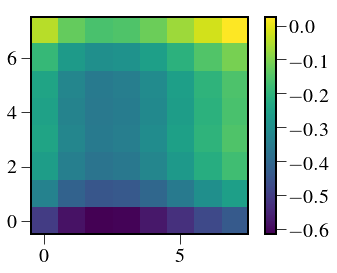

In [18]:
dat = X.T-x
crop=50
plt.imshow(dat[crop:-crop,crop:-crop])
plt.colorbar()
print coef

# Old school wavelength calibration with individual fine cal

Notion here is to:
1. Use standard calibration method with polynomial fits
2. Go and centroid each psflet individually for each wavelength
3. Compute average dx and dy, and memorize those offsets for any future polynomial calculation

In [90]:
import os
os.chdir('/Users/mrizzo/IFS/crispy/crispy/PISCES/')
from params import Params
par = Params()
par.hdr


SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                    8 / array data type                                
NAXIS   =                    0 / number of array dimensions                     
EXTEND  =                    T                                                  
COMMENT                                                                         
COMMENT ************************************************************            
COMMENT ********************** General parameters ******************            
COMMENT ************************************************************            
COMMENT                                                                         
NLENS   =                  108 / # lenslets across array                        
PITCH   =             0.000174 / Lenslet pitch (meters)                         
INTERLAC=                    2 / Interlacing                                    
PHILENS =    26.565051177077

In [7]:
from crispy.tools.image import Image
from crispy.tools.locate_psflets import locatePSFlets
par.gaussian_hires=False # since par.gaussian_hires is False, it will attempt to make high-resolution PSFLets
par.lamlist = np.arange(605.,730.,10)
par.filelist = [par.wavecalDir+'det'+str(wav)+'.fits' for wav in par.lamlist]
print par.filelist[5]
ysize, xsize = Image(filename=par.filelist[0]).data.shape
mask = np.ones((ysize, xsize))*1.0
order = 3

coef = None

genwavelengthsol = True

for i, ifile in enumerate([par.filelist[0]]):
    im = Image(filename=ifile)
    im.ivar = mask
    x, y, good, coef = locatePSFlets(im, polyorder=order, mask=mask, sig=par.FWHM / \
                                     2.35, coef=coef, phi=par.philens, 
                                     scale=par.pitch / par.pixsize, nlens=par.nlens,
                                     trimfrac=0.0)



..//ReferenceFiles/Calibra_170425/det655.0.fits
crispy - INFO - Read data from HDU 1 of ..//ReferenceFiles/Calibra_170425/det605.0.fits
crispy - INFO - Read data from HDU 1 of ..//ReferenceFiles/Calibra_170425/det605.0.fits
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame ..//ReferenceFiles/Calibra_170425/det605.0.fits
crispy - INFO - Array origin: (527.50672466208732, 514.89776744631104)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame ..//ReferenceFiles/Calibra_170425/det605.0.fits
crispy - INFO - Array origin: (527.47263889106875, 514.99885246252416)


## Scratch vertical offset calculation

(1.7852975606661181, 1.6666666, 4.5486891138405223)


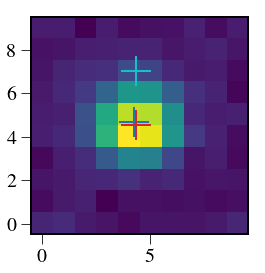

In [123]:
from astropy.stats import sigma_clipped_stats
mean, median, std = sigma_clipped_stats(im.data, sigma=3.0, iters=5) 
print((mean, median, std))  
from photutils import centroid_com, centroid_1dg, centroid_2dg
lensX=-20
lensY=54

halfsize=5
xl = x[lensX,lensY]
yl = y[lensX,lensY]
xmin = int(xl-halfsize)+1
ymin = int(yl-halfsize)+1
cutout = im.data[ymin:ymin+2*halfsize,xmin:xmin+2*halfsize]
x1, y1 = centroid_com(cutout)
x2, y2 = centroid_1dg(cutout)
x3, y3 = centroid_2dg(cutout)
plt.imshow(cutout, origin='lower', interpolation='nearest', cmap='viridis')
marker = '+'
ms, mew = 30, 2.
plt.plot(x1, y1, color='#1f77b4', marker=marker, ms=ms, mew=mew)
plt.plot(x2, 7, color='#17becf', marker=marker, ms=ms, mew=mew)
plt.plot(x3, y3, color='#d62728', marker=marker, ms=ms, mew=mew)


In [37]:
com = np.sum(np.sum(cutout,axis=0)*np.arange(-halfsize,halfsize))/np.sum(np.sum(cutout,axis=0))
print com

-0.253056977975


## Vertical offset calculation for all psflets

In [125]:
dy = np.zeros_like(x)

halfsize=5
lx = min(im.data.shape)-halfsize
for i in range(x.shape[0]):
    for j in range(x.shape[1]):
        xl = x[i,j]
        yl = y[i,j]
        xmin = int(xl-halfsize)+1
        ymin = int(yl-halfsize)+1
        if ymin>0 and xmin>0 and xmin+2*halfsize<lx and ymin+2*halfsize<lx:
            cutout = im.data[ymin:ymin+2*halfsize,xmin:xmin+2*halfsize]
#             mask = cutout>median+2*std
#             cutout[~mask] = np.nan
#             dy[i,j] = np.nansum(np.nansum(cutout,axis=0)*np.arange(0,2*halfsize))/np.nansum(np.nansum(cutout,axis=0))
            dy[i,j] = centroid_2dg(cutout)[-1]
            dy[i,j] -= y[i,j]-ymin



KeyboardInterrupt: 

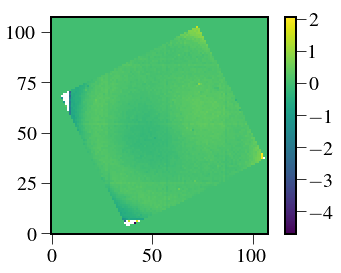

In [72]:
plt.imshow(dy)
plt.colorbar()
out = fits.HDUList(fits.PrimaryHDU(dy.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/dy.fits',overwrite=True)


## Repeat for entire wavelength calibration

In [120]:
from crispy.tools.image import Image
from crispy.tools.locate_psflets import locatePSFlets
par.gaussian_hires=False # since par.gaussian_hires is False, it will attempt to make high-resolution PSFLets
par.lamlist = np.arange(605.,730.,10)
par.filelist = [par.wavecalDir+'det'+str(wav)+'.fits' for wav in par.lamlist]
from astropy.stats import sigma_clipped_stats
from photutils import centroid_com, centroid_1dg, centroid_2dg

coef = None
allcoef = []
imlist = []
xlist = []
ylist = []
dylist = []
dxlist = []
order=3
trimfrac=0.0


ysize, xsize = Image(filename=par.filelist[0]).data.shape
mask = np.ones((ysize, xsize))


halfsize=5
lx = min(Image(filename=par.filelist[0]).data.shape)-halfsize

for m, ifile in enumerate([par.filelist[0]]):
    im = Image(filename=ifile)
    # sets the inverse variance to be the mask
    mean, median, std = sigma_clipped_stats(im.data, sigma=3.0, iters=5)
    print "Mean, median, std: {:}".format((mean,median,std))
    imlist += [im]
    if genwavelengthsol:
        ## CHARIS regular wavecal step
        x, y, good, coef = locatePSFlets(im, polyorder=order, mask=mask, sig=1., 
                            coef=coef, phi=par.philens, 
                            scale=par.pitch / par.pixsize, nlens=par.nlens,
                            trimfrac=trimfrac)
        dy = np.zeros_like(x)
        dx = np.zeros_like(x)
        snr = np.zeros_like(x)
        mgrid = np.arange(2*halfsize)
        xgrid,ygrid = np.meshgrid(mgrid,mgrid)

        for i in range(x.shape[0]):
            for j in range(x.shape[1]):
                if j == 54 and k == 54:
                    xl = x[i,j]
                    yl = y[i,j]
                    xmin = int(xl-halfsize)+1
                    ymin = int(yl-halfsize)+1
                    if ymin>0 and xmin>0 and xmin+2*halfsize<lx and ymin+2*halfsize<lx:
                        cutout = im.data[ymin:ymin+2*halfsize,xmin:xmin+2*halfsize].copy()
                        cmask = cutout>median+2*std
    #                     cutout[~cmask] = np.nan
    #                     dy[i,j] = np.nansum(np.nansum(cutout,axis=0)*np.arange(0,2*halfsize))/np.nansum(np.nansum(cutout,axis=0))
                        dx[i,j],dy[i,j] = centroid_com(cutout)
                        apmask = (xgrid-dx[i,j])**2+(ygrid-dy[i,j])**2<3**2
                        apval = np.nansum(apmask*cutout)
                        snr[i,j] = apval/(np.sqrt(np.nansum(apmask))*std)
                        dy[i,j] -= y[i,j]-ymin
                        dx[i,j] -= x[i,j]-xmin
#         dy[np.abs(dy)>2]=0.0
#         dx[np.abs(dx)>2]=0.0
#         for j in range(x.shape[0]):
#             for k in range(x.shape[1]):
#                 if j == 54 and k == 54:
#                     xl = x[j,k]
#                     yl = y[j,k]
#                     xmin = int(xl-halfsize)+1
#                     ymin = int(yl-halfsize)+1
#                     if ymin>0 and xmin>0 and xmin+2*halfsize<xsize and ymin+2*halfsize<ysize:
#                         cutout = im.data[ymin:ymin+2*halfsize,xmin:xmin+2*halfsize]
#                         dx[j,k],dy[j,k] = centroid_com(cutout)
#                         apmask = (xgrid-dx[j,k])**2+(ygrid-dy[j,k])**2<3**2
#                         apval = np.nansum(apmask*cutout)
#                         snr[j,k] = apval/(np.sqrt(np.nansum(apmask))*std)
#                         dy[j,k] -= y[j,k]-ymin
#                         dx[j,k] -= x[j,k]-xmin


#         dxlist += [dx]
#         dylist += [dy]


crispy - INFO - Read data from HDU 1 of ..//ReferenceFiles/Calibra_170425/det605.0.fits
crispy - INFO - Read data from HDU 1 of ..//ReferenceFiles/Calibra_170425/det605.0.fits
crispy - INFO - Read data from HDU 1 of ..//ReferenceFiles/Calibra_170425/det605.0.fits
Mean, median, std: (1.7852975606661181, 1.6666666, 4.5486891138405223)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame ..//ReferenceFiles/Calibra_170425/det605.0.fits
crispy - INFO - Array origin: (527.50655119890325, 514.91290760048366)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame ..//ReferenceFiles/Calibra_170425/det605.0.fits
crispy - INFO - Array origin: (527.48566231222105, 515.00559834994999)


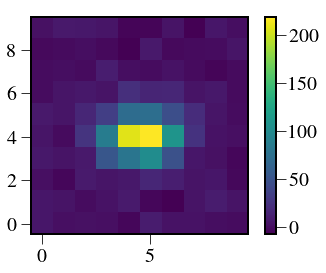

In [122]:

plt.imshow(cutout)
plt.colorbar()

In [108]:
dylistarr = np.array(dylist)
out = fits.HDUList(fits.PrimaryHDU(dylistarr.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/dylistarr.fits',overwrite=True)
dxlistarr = np.array(dxlist)
out = fits.HDUList(fits.PrimaryHDU(dxlistarr.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/dxlistarr.fits',overwrite=True)
out = fits.HDUList(fits.PrimaryHDU(snr.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/snr.fits',overwrite=True)


In [80]:
out = fits.HDUList(fits.PrimaryHDU(np.mean(dylistarr,axis=0).astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/dylistarr_mean.fits',overwrite=True)
out = fits.HDUList(fits.PrimaryHDU(np.std(dylistarr,axis=0).astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/dylistarr_std.fits',overwrite=True)
out = fits.HDUList(fits.PrimaryHDU(np.mean(dxlistarr,axis=0).astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/dxlistarr_mean.fits',overwrite=True)
out = fits.HDUList(fits.PrimaryHDU(np.std(dxlistarr,axis=0).astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/dxlistarr_std.fits',overwrite=True)


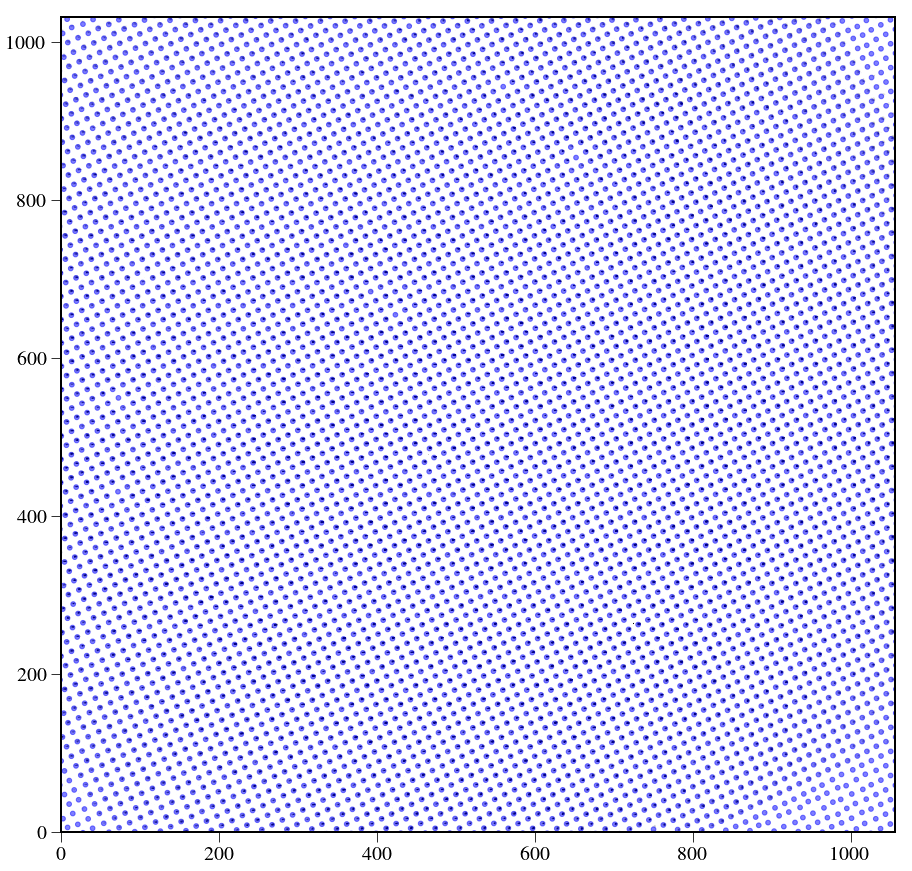

In [99]:
x.shape
dx.shape
do_inspection(par, im.data, x+dx, y+dy, 600)

## Inspect offsets

In [155]:
yoffsets = fits.getdata(par.wavecalDir + 'dylistarr.fits')
lam = np.loadtxt(par.wavecalDir + "lamsol.dat")[:, 0]
allcoef = np.loadtxt(par.wavecalDir + "lamsol.dat")[:, 1:]
print par.wavecalDir
print lam,allcoef.shape

..//ReferenceFiles/Calibra_170425/
[ 605.  615.  625.  635.  645.  655.  665.  675.  685.  695.  705.  715.
  725.] (13, 20)


In [163]:
from crispy.unitTests import testCutout

# img1 = fits.getdata(par.filelist[0])
# img = np.zeros_like(img1)
# for i in range(-54,54):
#     for j in range(-54,54):

#         _, _, [x0, x1, y0, y1] = testCutout(par,par.filelist[0],lensX=i,lensY=j)
#         img[x0:x1, y0:y1] += yoffsets[0,i+54,j+54]


from crispy.tools.reduction import _tag_psflets
img1 = fits.getdata(par.filelist[0])
img = np.zeros_like(img1)

polychromekey = fits.open(
    par.wavecalDir +
    'polychromekeyR%d.fits' %
    (par.R))
xindx = polychromekey[1].data
yindx = polychromekey[2].data
good = polychromekey[3].data
polychromeR = fits.open(
    par.wavecalDir +
    'polychromeR%d.fits.gz' %
    (par.R))
psflets = polychromeR[0].data


for k in range(len(psflets)):
    if k%3==0:
        psfletsmask = psflets[k] > 0.2*np.amax(psflets[k])
        ydim, xdim = img1.shape
        _x = xindx[k]
        _y = yindx[k]
        good = (_x > dy) * (_x < xdim - dy) * (_y > dy) * (_y < ydim - dy)
        psflet_indx = _tag_psflets(
            img1.shape, _x, _y, good, dx=10, dy=10)
        coefs_flat = np.reshape(yoffsets[k], -1)
        img += psfletsmask * coefs_flat[psflet_indx]
    
out = fits.HDUList(fits.PrimaryHDU(img.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/img.fits',overwrite=True)


## Calculate y offsets from flatfield

In [168]:
PSFlet_tool = PSFLets(load=True, infiledir=par.wavecalDir)
#Nspec = int(par.BW*par.npixperdlam*par.R)
from crispy.tools.reduction import calculateWaveList
lamlist, scratch = calculateWaveList(par, method='optext')


img = fits.getdata(par.codeRoot+"/Inputs/BB.fits")
# img-=30
delt_y=6
xindx = PSFlet_tool.xindx
yindx = PSFlet_tool.yindx
Nmax = PSFlet_tool.nlam_max
try:
    sig = fits.open(par.wavecalDir + 'PSFwidths.fits')[0].data
except BaseException:
    log.warning(
        "No PSFLet widths found - assuming critical samping at central wavelength")
    sig = par.FWHM / 2.35 * np.ones(xindx.shape)
#     sig = 1.8 / 2.35 * np.ones(xindx.shape)

x = np.arange(img.shape[1])
y = np.arange(img.shape[0])
x, y = np.meshgrid(x, y)

ydim, xdim = img.shape

coefs = np.zeros(
    tuple([max(Nmax, lamlist.shape[0])] + list(yindx.shape)[:-1]))
cube = np.zeros((len(lamlist), par.nlens, par.nlens))
ivarcube = np.zeros((len(lamlist), par.nlens, par.nlens))
xarr, yarr = np.meshgrid(np.arange(Nmax), np.arange(delt_y))

#loglam = np.log(lamlist)
lamsol = np.loadtxt(par.wavecalDir + "lamsol.dat")[:, 0]
allcoef = np.loadtxt(par.wavecalDir + "lamsol.dat")[:, 1:]
PSFlet_tool.geninterparray(lamsol, allcoef)

good = PSFlet_tool.good

offsets = np.zeros((par.nlens, par.nlens))


for i in range(xindx.shape[0]):
    for j in range(yindx.shape[1]):
#         if i==108/2+lensY and j==108/2+lensX:
            if good[i, j]:
                _x = xindx[i, j, :PSFlet_tool.nlam[i, j]]
                _y = yindx[i, j, :PSFlet_tool.nlam[i, j]]
                _sig = sig[i, j, :PSFlet_tool.nlam[i, j]]
                _lam = PSFlet_tool.lam_indx[i, j, :PSFlet_tool.nlam[i, j]]
                iy = np.nanmean(_y)
                
                if ~np.isnan(iy):
                    i1 = int(iy - delt_y / 2.)
                    dy = _y[xarr[:,
                                 :len(_lam)]] - y[i1:i1 + delt_y,
                                                  int(_x[0]):int(_x[-1]) + 1]

                    data = img[i1:i1 + delt_y, int(_x[0]):int(_x[-1]) + 1]
                    vals = np.sum(data,axis=1)
                    offsets[i,j] = np.sum(vals*np.arange(-delt_y/2.,delt_y/2.))/np.sum(vals)

out = fits.HDUList(fits.PrimaryHDU(offsets.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/newyoffsets.fits',overwrite=True)
                    

crispy - INFO - Reduced cube will have 22 wavelength bins


# SNR grid run for new wavelength calibration with individual PSFlet fits

In [2]:
import os
os.chdir('/Users/mrizzo/IFS/crispy/crispy/WFIRST/')
from params import Params
par = Params()
par.hdr

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                    8 / array data type                                
NAXIS   =                    0 / number of array dimensions                     
EXTEND  =                    T                                                  
COMMENT                                                                         
COMMENT ************************************************************            
COMMENT ********************** General parameters ******************            
COMMENT ************************************************************            
COMMENT                                                                         
NLENS   =                  108 / # lenslets across array                        
PITCH   =             0.000174 / Lenslet pitch (meters)                         
INTERLAC=                  2.0 / Interlacing                                    
PHILENS =    26.565051177077

## Create grid of PSFlets

### Polynomials coefficients


In [33]:
Xcoefs = np.array([512,par.pitch / par.pixsize,0.00,0.,-6,0.0,0.0,0.00,0.0,0.0])
Ycoefs = np.array([512,6,0.00,0.,12,0.0,0.0,0.00,0.0,0.0])
newcoefs = np.concatenate([Xcoefs,Ycoefs])

In [6]:
print par.philens

0.463647609001


### PSFlet indices

In [3]:
order = 3
xindx = np.arange(-108 / 2, 108 / 2)
xindx, yindx = np.meshgrid(xindx, xindx)


### Create map

512.0
512.0


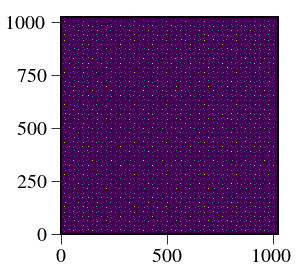

In [4]:
from crispy.tools.locate_psflets import transform
from crispy.tools.imgtools import gausspsf
newcoefs = [512.0, 11.971563941075797, 0.0, 0.0, -5.9857819705378983, 0.0, 0.0, 0.0, 0.0, 0.0, 512.0, 5.9857819705378983, 0.0, 0.0, 11.971563941075797, 0.0, 0.0, 0.0, 0.0, 0.0]
Xc,Yc = transform(xindx,yindx,3,newcoefs)

fwhm=2
gsize = 5
flux=1.0
lx = 1024+2*gsize
detectorFrame = np.zeros((lx,lx))
print Yc[108 / 2, 108 / 2]
print Xc[108 / 2, 108 / 2]
ry = np.reshape(Yc,-1)
rx = np.reshape(Xc,-1)
for i in range(len(ry)):
        yi = ry[i]+gsize
        xi = rx[i]+gsize
        xmin = int(xi)-gsize
        xmax = xmin+2*gsize
        ymin = int(yi)-gsize
        ymax = ymin+2*gsize
        if ymin>0 and xmin>0 and xmax<lx and ymax<lx:
            dx = xi - np.floor(xi) + 0.5
            dy = yi - np.floor(yi) + 0.5
            detectorFrame[ymin:ymax,xmin:xmax]+=flux*gausspsf(size=2*gsize,fwhm=fwhm,offx=-dx,offy=-dy)

detectorFrame = detectorFrame[gsize:-gsize,gsize:-gsize]
plt.imshow(detectorFrame)
out = fits.HDUList(fits.PrimaryHDU(detectorFrame.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/detectorFrame.fits',overwrite=True)


### Test built-in function

In [5]:
from crispy.IFS import quickMonochromatic
from crispy.tools.locate_psflets import initcoef,transform

[512.0, 11.971563941075797, 0.0, 0.0, -5.9857819705378983, 0.0, 0.0, 0.0, 0.0, 0.0, 512.0, 5.9857819705378983, 0.0, 0.0, 11.971563941075797, 0.0, 0.0, 0.0, 0.0, 0.0]


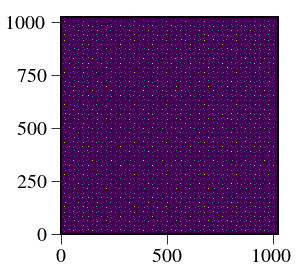

In [7]:
dispersion = par.npixperdlam * par.R * np.log(660. / par.FWHMlam)
coef = initcoef(
    3,
    scale=par.pitch / par.pixsize,
    phi=par.philens,
    x0=par.npix // 2,
    y0=par.npix // 2 +dispersion)
det,coefpass,coords = quickMonochromatic(par,returnCoords=True,coefs=coef)
plt.imshow(det)
print coef

In [8]:
print coefpass
out = fits.HDUList(fits.PrimaryHDU(det.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/det3.fits',overwrite=True)
# xcen = coords[0]
# ycen = coords[1]
xcen, ycen = transform(xindx, yindx, 3, coef)

# noisy = np.random.poisson(10000*det)
# from scipy import ndimage
# interpimg = ndimage.map_coordinates(noisy, [ycen-1,xcen-1], mode='constant',
#                                    cval=np.nan, prefilter=True)
# plt.imshow(interpimg[30:-30,30:-30])
# plt.colorbar(orientation='horizontal')

[512.0, 11.971563941075797, 0.0, 0.0, -5.9857819705378983, 0.0, 0.0, 0.0, 0.0, 0.0, 512.0, 5.9857819705378983, 0.0, 0.0, 11.971563941075797, 0.0, 0.0, 0.0, 0.0, 0.0]


crispy - INFO - The number of input pixels per lenslet is 5.000000
crispy - INFO - Using PSFlet gaussian approximation
crispy - WARNING - Assuming slices are evenly spread in wavelengths
crispy - INFO - Creating Gaussian PSFLet templates
crispy - INFO - Writing data to ..//SimResults/imagePlaneRot.fits
crispy - INFO - Writing data to ..//SimResults/detectorFramepoly.fits
crispy - INFO - Writing data to ..//SimResults/detectorFrame.fits
crispy - INFO - Done.
crispy - INFO - Performance: 6 seconds total
crispy - INFO - Writing data to /Users/mrizzo/Downloads/det_660_fwhm=2.fits


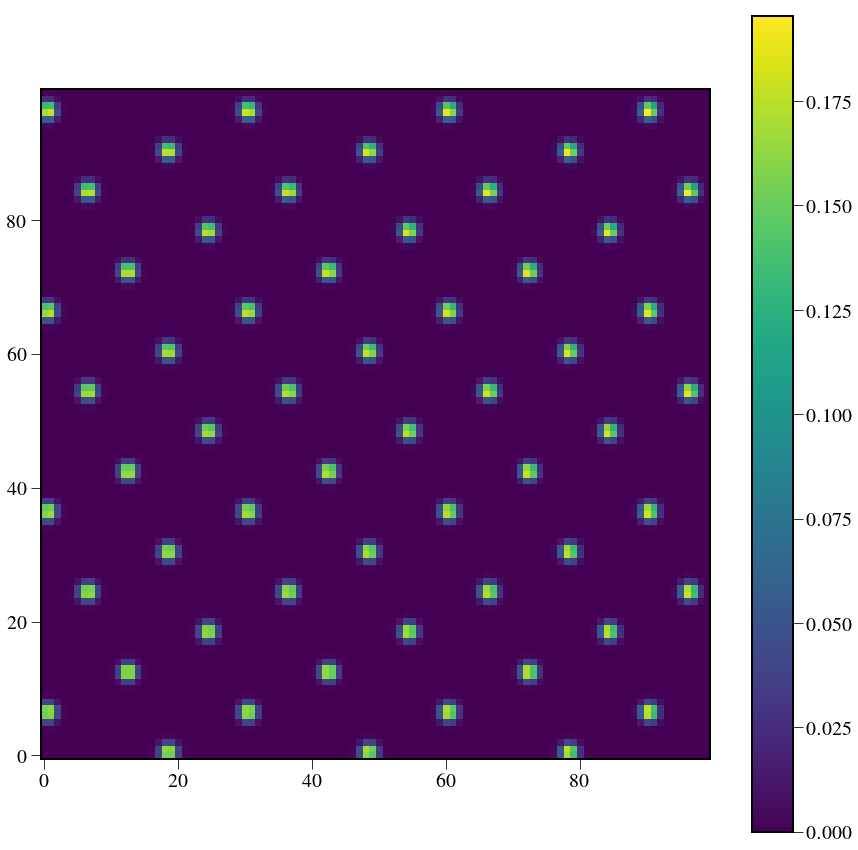

In [ ]:
import os
os.chdir('/Users/mrizzo/IFS/crispy/crispy/WFIRST/')
from params import Params
par = Params()
par.hdr

from crispy.IFS import polychromeIFS,getQE
from crispy.tools.image import Image
lam = 660.
inputCube = np.ones((1, 1024, 1024), dtype=float)
inCube = fits.HDUList(fits.PrimaryHDU(inputCube))
inCube[0].header['LAM_C'] = 0.66
inCube[0].header['PIXSIZE'] = 0.1
filelist = []
par.FWHM=2.0
x0=0.0
dlam = 1./(getQE(par,lam)*(par.lenslet_sampling/inCube[0].header['PIXSIZE'])**2)  # this normalizes the image so that each lenslet has a volume of 1
par.saveRotatedInput=True
detectorFrame = polychromeIFS(
    par,
    [lam],
    inCube[0],
    dlambda=dlam,
    parallel=False,
    dx=x0)
filename = '/Users/mrizzo/Downloads/det_%3d_fwhm=%d.fits' % (lam,int(par.FWHM))
Image(data=detectorFrame, header=par.hdr).write(filename)
plt.figure(figsize=(15,15))
plt.imshow(detectorFrame[500:600,500:600])
plt.colorbar()

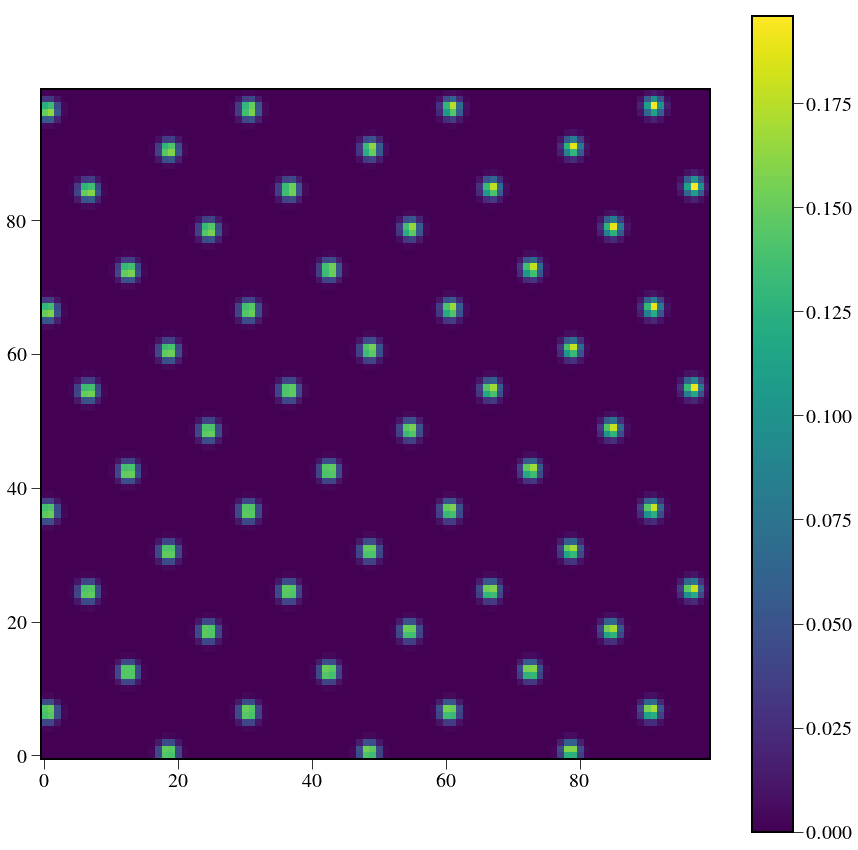

In [11]:
# Xcoefs = np.array([512.0,12.0,0.01,0.,-6.0,0.0,0.0,0.01,0.0,0.0])
# Ycoefs = np.array([512.0,6.0,0.01,0.,12.0,0.0,0.0,0.01,0.0,0.0])
# newcoefs = np.concatenate([Xcoefs,Ycoefs])
newcoefs = [512.0, 11.971563941075797, 0.01, 0.0, -5.9857819705378983, 0.0, 0.0, 0.0, 0.0, 0.0, 
 512.0, 5.9857819705378983, 0.01, 0.0, 11.971563941075797, 0.0, 0.0, 0.0, 0.0, 0.0]
det,newc = quickMonochromatic(par,coefs=newcoefs)
plt.figure(figsize=(15,15))
plt.imshow(det[500:600,500:600])
plt.colorbar()

## Perform enhanced wavecal for various snrs

In [15]:
from crispy.tools.image import Image
from crispy.tools.locate_psflets import locatePSFlets
from astropy.stats import sigma_clipped_stats
from photutils import centroid_com
from crispy.IFS import quickMonochromatic

lam=660.
# dispersion = par.npixperdlam * par.R * np.log(660. / par.FWHMlam)
# coef = initcoef(
#     3,
#     scale=par.pitch / par.pixsize,
#     phi=par.philens,
#     x0=par.npix // 2,
#     y0=par.npix // 2 +dispersion)
# order = 3
# xindx = np.arange(-108 / 2, 108 / 2)
# xindx, yindx = np.meshgrid(xindx, xindx)
# xcen,ycen = transform(xindx,yindx,order,coef)

newcoefs = [512.0, 11.971563941075797, 0.01, 0.0, -5.9857819705378983, 0.0, 0.0, 0.0, 0.0, 0.0, 
 512.0, 5.9857819705378983, 0.01, 0.0, 11.971563941075797, 0.0, 0.0, 0.0, 0.0, 0.0]
det,newc = quickMonochromatic(par,coefs=newcoefs)
xcen,ycen = transform(xindx,yindx,order,newcoefs)

# det = fits.getdata('/Users/mrizzo/Downloads/det_%3d_fwhm=%d.fits' % (lam,int(par.FWHM)))

ntrials = 100
SNR = 10
Xlist = []
Ylist = []
xlist = []
ylist = []
snrlist = []
for i in range(ntrials):
    noisy = np.random.poisson(SNR**2*det)
    ysize, xsize = noisy.shape
    mask = np.ones((ysize, xsize))
    order = 3

    coef = None
    allcoef = []

    im = Image(data=noisy)
    im.write('/Users/mrizzo/Downloads/noisy.fits')
    im.ivar = mask
    mean, median, std = sigma_clipped_stats(im.data, sigma=3.0, iters=5)
    log.info('Mean, median, std: {:}'.format((mean, median, std)))

    x, y, good, coef = locatePSFlets(im, polyorder=order, 
                                     mask=mask, sig=2., coef=coef, 
                                     phi=par.philens, scale=par.pitch / par.pixsize, 
                                     nlens=par.nlens, trimfrac=0.0)

    ## crispy enhanced wavecal step
    log.info('Fine calibration')
    halfsize=5
    dy = np.zeros_like(y)
    dx = np.zeros_like(x)
    snr = np.zeros_like(x)
    mgrid = np.arange(2*halfsize)
    xgrid,ygrid = np.meshgrid(mgrid,mgrid)

    for j in range(x.shape[0]):
        for k in range(x.shape[1]):
            xl = x[j,k]
            yl = y[j,k]
            xmin = int(xl-halfsize)+1
            ymin = int(yl-halfsize)+1
            if ymin>0 and xmin>0 and xmin+2*halfsize<xsize and ymin+2*halfsize<ysize:
                cutout = im.data[ymin:ymin+2*halfsize,xmin:xmin+2*halfsize]-median
                dx[j,k],dy[j,k] = centroid_com(cutout)
                apmask = (xgrid-dx[j,k])**2+(ygrid-dy[j,k])**2<3**2
                apval = np.nansum(apmask*cutout)
#                 snr[j,k] = apval/(np.sqrt(np.nansum(apmask))*std)
                snr[j,k] = np.sqrt(apval)
                dy[j,k] -= y[j,k]-ymin
                dx[j,k] -= x[j,k]-xmin
#     dy[snr<10]=0.0
#     dx[snr<10]=0.0
    dy[np.abs(dy)>2]=0.0
    dx[np.abs(dx)>2]=0.0

    
    xlist.append(xcen-x+0.5)
    ylist.append(ycen-y+0.5)
    X = (xcen-(x-dx)+0.5)
    Y = (ycen-(y-dy)+0.5)
#     X = (xcen-x-1)
#     Y = (ycen-y-1)
    Xlist.append(X)
    Ylist.append(Y)
    snrlist.append(snr)
    

crispy - INFO - Writing data to /Users/mrizzo/Downloads/noisy.fits
main - INFO - Mean, median, std: (0.0, 0.0, 0.0)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.67205934123535, 512.74481305634743)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.47761535645509, 512.45170067085633)
main - INFO - Fine calibration
crispy - INFO - Writing data to /Users/mrizzo/Downloads/noisy.fits
main - INFO - Mean, median, std: (0.0, 0.0, 0.0)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.68333997482011, 512.74854105558495)
crispy - INFO - Performing final optimization of PSFlet locati

crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.70429311902694, 512.76615818345215)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.47406043752028, 512.52320936580463)
main - INFO - Fine calibration
crispy - INFO - Writing data to /Users/mrizzo/Downloads/noisy.fits
main - INFO - Mean, median, std: (0.0, 0.0, 0.0)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.72480884069932, 512.68791441960116)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50193844592957, 512.52191919804136)
main - INFO - Fine calibration
crispy - INFO - Writing data to /Users/mrizzo

crispy - INFO - Array origin: (512.5074723133697, 512.52196237807959)
main - INFO - Fine calibration
crispy - INFO - Writing data to /Users/mrizzo/Downloads/noisy.fits
main - INFO - Mean, median, std: (0.0, 0.0, 0.0)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.71098859472613, 512.53394257177388)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50447080412118, 512.51336199656907)
main - INFO - Fine calibration
crispy - INFO - Writing data to /Users/mrizzo/Downloads/noisy.fits
main - INFO - Mean, median, std: (0.0, 0.0, 0.0)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (5

crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.76753904252996, 512.79333342868085)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.59456602620514, 512.49592312157893)
main - INFO - Fine calibration
crispy - INFO - Writing data to /Users/mrizzo/Downloads/noisy.fits
main - INFO - Mean, median, std: (0.0, 0.0, 0.0)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.68119010217447, 512.74689011502949)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50300606503765, 512.4594367026225)
main

crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.54284532763677, 512.47987105171273)
main - INFO - Fine calibration
crispy - INFO - Writing data to /Users/mrizzo/Downloads/noisy.fits
main - INFO - Mean, median, std: (0.0, 0.0, 0.0)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.76059929739699, 512.74616039800503)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50765690718572, 512.50385407475324)
main - INFO - Fine calibration
crispy - INFO - Writing data to /Users/mrizzo/Downloads/noisy.fits
main - INFO - Mean, median, std: (0.0, 0.0, 0.0)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initia

crispy - INFO - Writing data to /Users/mrizzo/Downloads/noisy.fits
main - INFO - Mean, median, std: (0.0, 0.0, 0.0)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.71766714004298, 512.77654710063166)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.50141232368117, 512.48680875061166)
main - INFO - Fine calibration
crispy - INFO - Writing data to /Users/mrizzo/Downloads/noisy.fits
main - INFO - Mean, median, std: (0.0, 0.0, 0.0)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.69520826755343, 512.75244413707799)
crispy - INFO - Performing final optimization of PSFlet locati

crispy - INFO - Array origin: (512.77057216324192, 512.75057369643298)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.49318110805473, 512.48339256098745)
main - INFO - Fine calibration
crispy - INFO - Writing data to /Users/mrizzo/Downloads/noisy.fits
main - INFO - Mean, median, std: (0.0, 0.0, 0.0)
crispy - INFO - Initializing PSFlet location transformation coefficients
crispy - INFO - Performing initial optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.73005331733373, 512.716363241012)
crispy - INFO - Performing final optimization of PSFlet location transformation coefficients for frame 
crispy - INFO - Array origin: (512.47564943660018, 512.5155702656391)
main - INFO - Fine calibration
crispy - INFO - Writing data to /Users/mrizzo/Downloads/noisy.fits
main - INFO - Mean, median, std: (0.0, 0.0, 0.0)
crispy - INFO - Initializing PSFlet lo

In [56]:
print (coef-newcoefs)

[  1.77156981e-02  -1.79654335e-03  -1.26813229e-06   1.44648474e-06
  -2.73007253e-04  -9.46429590e-06  -1.04931457e-06  -1.66272821e-05
   1.13053233e-06   2.51986909e-07  -1.29290057e-02   1.99216441e-03
  -5.14300345e-07  -1.25162852e-06   4.31829579e-04   1.75612552e-05
   5.58948252e-07   1.22081834e-05  -2.15736828e-06  -5.21587619e-07]


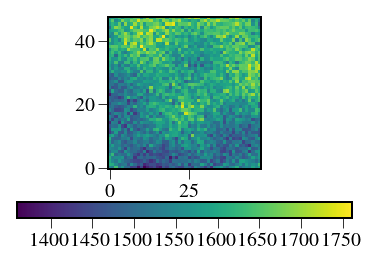

In [15]:
from scipy import ndimage
interpimg = ndimage.map_coordinates(noisy, [y-dy+0.5,x-dx+0.5], mode='constant',
                                   cval=np.nan, prefilter=True)
plt.imshow(interpimg[30:-30,30:-30])
plt.colorbar(orientation='horizontal')

In [13]:
Xlistarr = np.array(Xlist)
Ylistarr = np.array(Ylist)
xlistarr = np.array(xlist)
ylistarr = np.array(ylist)
snrlistarr = np.array(snrlist)
out = fits.HDUList(fits.PrimaryHDU(Xlistarr.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/Xlistarr%d.fits' % (ntrials),overwrite=True)
out = fits.HDUList(fits.PrimaryHDU(Ylistarr.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/Ylistarr%d.fits' % (ntrials),overwrite=True)
out = fits.HDUList(fits.PrimaryHDU(snrlistarr.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/snr%d.fits' % (ntrials),overwrite=True)
out = fits.HDUList(fits.PrimaryHDU(dx.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/dx%d.fits' % (ntrials),overwrite=True)
out = fits.HDUList(fits.PrimaryHDU(dy.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/dy%d.fits' % (ntrials),overwrite=True)
out = fits.HDUList(fits.PrimaryHDU(xlistarr.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/xlistarr%d.fits' % (ntrials),overwrite=True)
out = fits.HDUList(fits.PrimaryHDU(ylistarr.astype(np.float32)))
out.writeto('/Users/mrizzo/Downloads/ylistarr%d.fits' % (ntrials),overwrite=True)


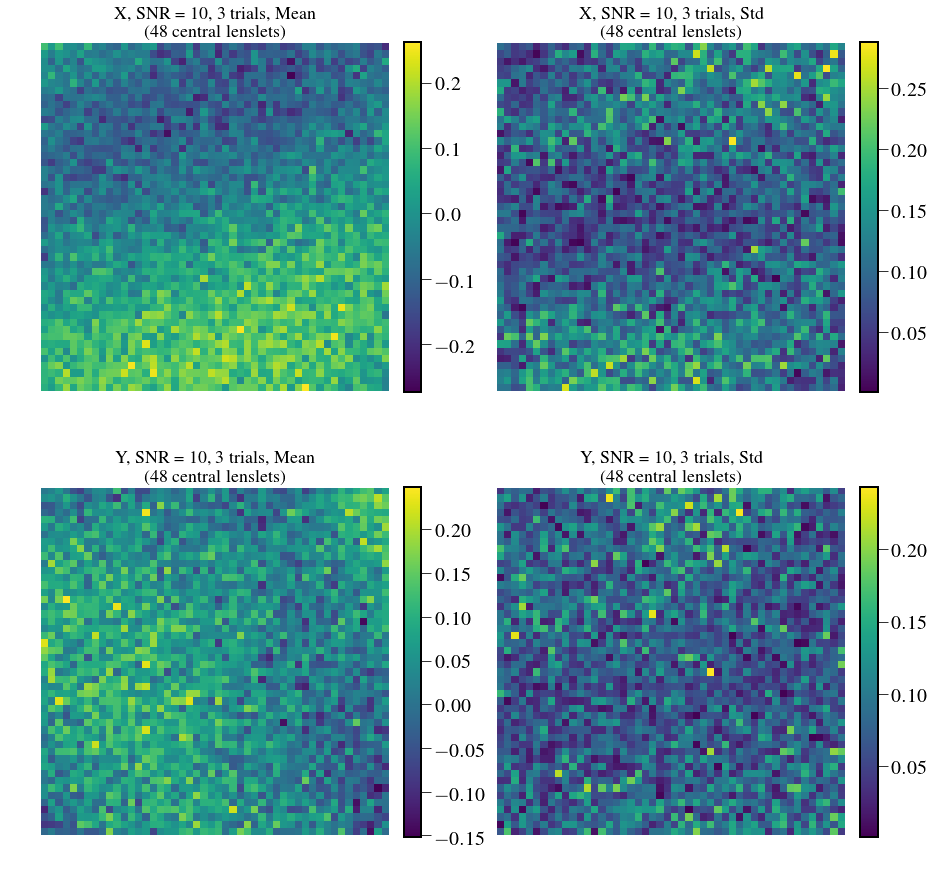

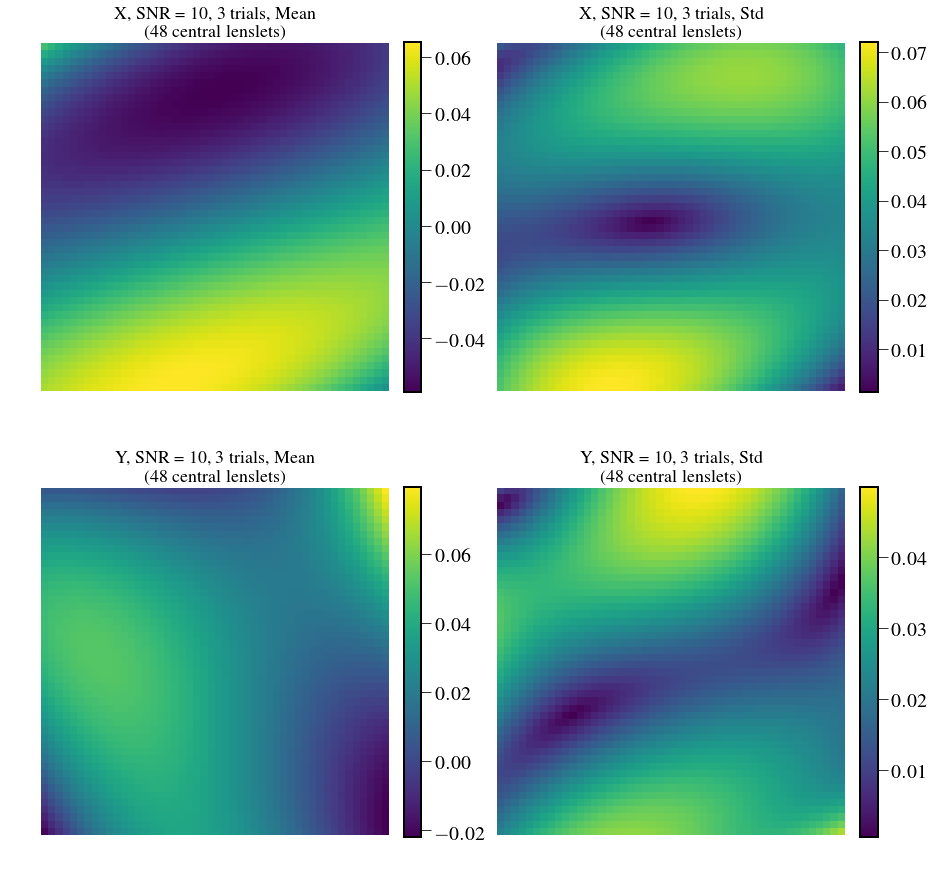

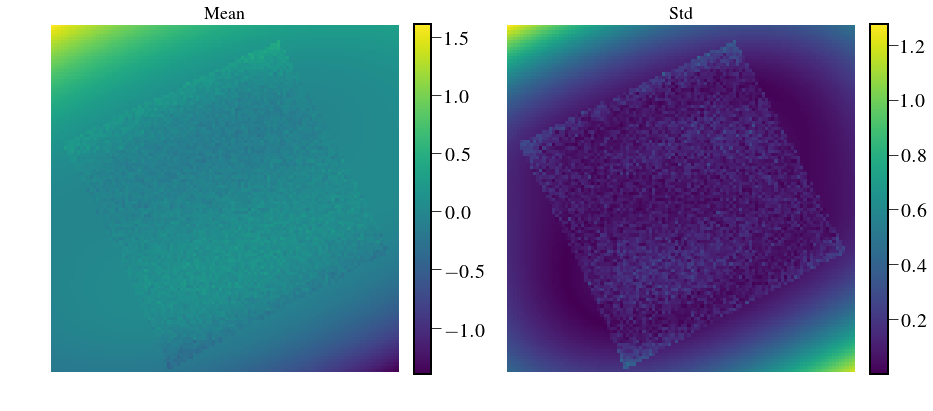

In [14]:
crop=30
plt.figure(figsize=(15,15))
plt.subplot(221)
plt.imshow(np.mean(Xlistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('X, SNR = %d, %d trials, Mean \n (%d central lenslets)'%(SNR,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(222)
plt.imshow(np.std(Xlistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('X, SNR = %d, %d trials, Std \n (%d central lenslets)'%(SNR,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(223)
plt.imshow(np.mean(Ylistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('Y, SNR = %d, %d trials, Mean \n (%d central lenslets)'%(SNR,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(224)
plt.imshow(np.std(Ylistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('Y, SNR = %d, %d trials, Std \n (%d central lenslets)'%(SNR,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)

crop=30
plt.figure(figsize=(15,15))
plt.subplot(221)
plt.imshow(np.mean(xlistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('X, SNR = %d, %d trials, Mean \n (%d central lenslets)'%(SNR,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(222)
plt.imshow(np.std(xlistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('X, SNR = %d, %d trials, Std \n (%d central lenslets)'%(SNR,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(223)
plt.imshow(np.mean(ylistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('Y, SNR = %d, %d trials, Mean \n (%d central lenslets)'%(SNR,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(224)
plt.imshow(np.std(ylistarr,axis=0)[crop:-crop,crop:-crop])
plt.title('Y, SNR = %d, %d trials, Std \n (%d central lenslets)'%(SNR,ntrials,108-2*crop))
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(np.mean(Xlistarr,axis=0))
plt.title('Mean')
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)
plt.subplot(122)
plt.imshow(np.std(Xlistarr,axis=0))
plt.title('Std ')
plt.axis('off')
plt.colorbar(fraction=0.046, pad=0.04)


# Scratch

1.0


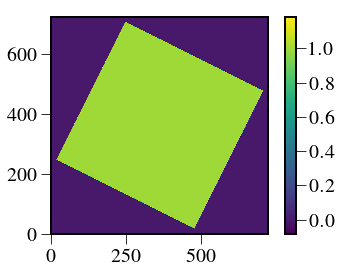

In [39]:
inputCube = np.ones((512, 512), dtype=float)
from crispy.tools.lenslet import processImagePlane
print par.pixperlenslet
img = processImagePlane(par,inputCube)
plt.imshow(img)
plt.colorbar()

In [27]:
Xcoefs = np.array([512,par.pitch / par.pixsize,0.01,0.,-6,0.0,0.0,0.01,0.0,0.0])
Ycoefs = np.array([512,6,0.01,0.,12,0.0,0.0,0.01,0.0,0.0])
newcoefs = np.concatenate([Xcoefs,Ycoefs])
print newcoefs

[  5.12000000e+02   1.33846154e+01   1.00000000e-02   0.00000000e+00
  -6.00000000e+00   0.00000000e+00   0.00000000e+00   1.00000000e-02
   0.00000000e+00   0.00000000e+00   5.12000000e+02   6.00000000e+00
   1.00000000e-02   0.00000000e+00   1.20000000e+01   0.00000000e+00
   0.00000000e+00   1.00000000e-02   0.00000000e+00   0.00000000e+00]


In [24]:
im.write('/Users/mrizzo/Downloads/noisy.fits')

crispy - INFO - Writing data to /Users/mrizzo/Downloads/noisy.fits
